In [208]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [209]:
#1.1 Read the data
ads_df = pd.read_excel('Clustering+Clean+Ads_Data.xlsx', sheet_name=0)

In [210]:
#Basic analysis - printing first 10 rows of dataset
ads_df.head(10)

,Timestamp,InventoryType,Ad - Length,Ad- Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
0,2020-9-2-17,Format1,300,250,75000,Inter222,Video,Desktop,Display,1806,325,323,1,0.00,0.35,0.0,0.0031,0.00,0.00
1,2020-9-2-10,Format1,300,250,75000,Inter227,App,Mobile,Video,1780,285,285,1,0.00,0.35,0.0,0.0035,0.00,0.00
2,2020-9-1-22,Format1,300,250,75000,Inter222,Video,Desktop,Display,2727,356,355,1,0.00,0.35,0.0,0.0028,0.00,0.00
3,2020-9-3-20,Format1,300,250,75000,Inter228,Video,Mobile,Video,2430,497,495,1,0.00,0.35,0.0,0.0020,0.00,0.00
4,2020-9-4-15,Format1,300,250,75000,Inter217,Web,Desktop,Video,1218,242,242,1,0.00,0.35,0.0,0.0041,0.00,0.00
5,2020-9-4-5,Format1,300,250,75000,Inter219,Video,Desktop,Display,490,64,64,2,0.00,0.35,0.0,0.0313,0.01,0.00
6,2020-9-4-6,Format1,300,250,75000,Inter221,App,Mobile,Video,1197,202,202,1,0.01,0.35,0.0,0.0050,0.03,0.01
7,2020-9-6-7,Format1,300,250,75000,Inter228,Video,Mobile,Video,1363,198,196,1,0.00,0.35,0.0,0.0051,0.00,0.00
8,2020-9-8-6,Format1,300,250,75000,Inter223,Web,Mobile,Video,1402,137,136,1,0.00,0.35,0.0,0.0074,0.02,0.00
9,2020-9-11-17,Format1,300,250,75000,Inter228,Video,Mobile,Display,1816,312,311,1,0.00,0.35,0.0,0.0032,0.00,0.00


In [211]:
#Basic analysis printing last 10 rows of dataset
ads_df.tail(10)

,Timestamp,InventoryType,Ad - Length,Ad- Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
23056,2020-11-23-4,Format4,120,600,72000,Inter223,Web,Mobile,Video,2,2,2,1,0.10,0.35,0.0650,NaN,NaN,NaN
23057,2020-11-20-2,Format4,120,600,72000,Inter224,Web,Desktop,Display,5,2,2,1,0.07,0.35,0.0455,NaN,NaN,NaN
23058,2020-11-4-3,Format5,720,300,216000,Inter223,Web,Mobile,Video,1,1,1,1,0.08,0.35,0.0520,NaN,NaN,NaN
23059,2020-11-13-4,Format5,720,300,216000,Inter228,Video,Mobile,Display,2,2,2,1,0.07,0.35,0.0455,NaN,NaN,NaN
23060,2020-11-16-5,Format4,120,600,72000,Inter225,Video,Mobile,Display,4,4,4,1,0.14,0.35,0.0910,NaN,NaN,NaN
23061,2020-9-13-7,Format5,720,300,216000,Inter220,Web,Mobile,Video,1,1,1,1,0.07,0.35,0.0455,NaN,NaN,NaN
23062,2020-11-2-7,Format5,720,300,216000,Inter224,Web,Desktop,Video,3,2,2,1,0.04,0.35,0.0260,NaN,NaN,NaN
23063,2020-9-14-22,Format5,720,300,216000,Inter218,App,Mobile,Video,2,1,1,1,0.05,0.35,0.0325,NaN,NaN,NaN
23064,2020-11-18-2,Format4,120,600,72000,inter230,Video,Mobile,Video,7,1,1,1,0.07,0.35,0.0455,NaN,NaN,NaN
23065,2020-9-14-0,Format5,720,300,216000,Inter221,App,Mobile,Video,2,2,2,1,0.09,0.35,0.0585,NaN,NaN,NaN


In [212]:
ads_df.shape

(23066, 19)

In [213]:
ads_df.info()
#missing values in last 3 columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23066 entries, 0 to 23065
Data columns (total 19 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Timestamp              23066 non-null  object 
 1   InventoryType          23066 non-null  object 
 2   Ad - Length            23066 non-null  int64  
 3   Ad- Width              23066 non-null  int64  
 4   Ad Size                23066 non-null  int64  
 5   Ad Type                23066 non-null  object 
 6   Platform               23066 non-null  object 
 7   Device Type            23066 non-null  object 
 8   Format                 23066 non-null  object 
 9   Available_Impressions  23066 non-null  int64  
 10  Matched_Queries        23066 non-null  int64  
 11  Impressions            23066 non-null  int64  
 12  Clicks                 23066 non-null  int64  
 13  Spend                  23066 non-null  float64
 14  Fee                    23066 non-null  float64
 15  Re

In [214]:
ads_df.describe(include = "all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Timestamp,23066,2018,2020-11-13-22,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN
InventoryType,23066,7,Format4,7165,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Ad - Length,23066.0,NaN,NaN,NaN,385.163097,233.651434,120.0,120.0,300.0,720.0,728.0
Ad- Width,23066.0,NaN,NaN,NaN,337.896037,203.092885,70.0,250.0,300.0,600.0,600.0
Ad Size,23066.0,NaN,NaN,NaN,96674.468048,61538.329557,33600.0,72000.0,72000.0,84000.0,216000.0
Ad Type,23066,14,Inter224,1658,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Platform,23066,3,Video,9873,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Device Type,23066,2,Mobile,14806,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Format,23066,2,Video,11552,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Available_Impressions,23066.0,NaN,NaN,NaN,2432043.665872,4742887.764666,1.0,33672.25,483771.0,2527711.75,27592861.0


In [215]:
ads_df.duplicated().sum()

0

In [216]:
ads_df.isnull().sum()

Timestamp                   0
InventoryType               0
Ad - Length                 0
Ad- Width                   0
Ad Size                     0
Ad Type                     0
Platform                    0
Device Type                 0
Format                      0
Available_Impressions       0
Matched_Queries             0
Impressions                 0
Clicks                      0
Spend                       0
Fee                         0
Revenue                     0
CTR                      4736
CPM                      4736
CPC                      4736
dtype: int64

In [217]:
def fill_nulls():
    ads_df['CPM'] = np.where(ads_df['CPM'].isnull(), (ads_df['Spend']/ads_df['Impressions'])*1000, ads_df['CPM'])
    ads_df['CPC'] = np.where(ads_df['CPC'].isnull(), (ads_df['Spend']/ads_df['Clicks']), ads_df['CPC'])
    ads_df['CTR'] = np.where(ads_df['CTR'].isnull(), (ads_df['Clicks']/ads_df['Impressions'])*100, ads_df['CTR'])

In [218]:
fill_nulls()

In [219]:
ads_df.isnull().sum()

Timestamp                0
InventoryType            0
Ad - Length              0
Ad- Width                0
Ad Size                  0
Ad Type                  0
Platform                 0
Device Type              0
Format                   0
Available_Impressions    0
Matched_Queries          0
Impressions              0
Clicks                   0
Spend                    0
Fee                      0
Revenue                  0
CTR                      0
CPM                      0
CPC                      0
dtype: int64

In [220]:
ads_df.describe(include = "all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Timestamp,23066,2018,2020-11-13-22,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN
InventoryType,23066,7,Format4,7165,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Ad - Length,23066.0,NaN,NaN,NaN,385.163097,233.651434,120.0,120.0,300.0,720.0,728.0
Ad- Width,23066.0,NaN,NaN,NaN,337.896037,203.092885,70.0,250.0,300.0,600.0,600.0
Ad Size,23066.0,NaN,NaN,NaN,96674.468048,61538.329557,33600.0,72000.0,72000.0,84000.0,216000.0
Ad Type,23066,14,Inter224,1658,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Platform,23066,3,Video,9873,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Device Type,23066,2,Mobile,14806,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Format,23066,2,Video,11552,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Available_Impressions,23066.0,NaN,NaN,NaN,2432043.665872,4742887.764666,1.0,33672.25,483771.0,2527711.75,27592861.0


In [221]:
#drop object type columns as they are not useful for clustering
ads_dfnew = ads_df.select_dtypes(exclude = ['object'])
ads_dfnew.head(5)

,Ad - Length,Ad- Width,Ad Size,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
0,300,250,75000,1806,325,323,1,0.0,0.35,0.0,0.0031,0.0,0.0
1,300,250,75000,1780,285,285,1,0.0,0.35,0.0,0.0035,0.0,0.0
2,300,250,75000,2727,356,355,1,0.0,0.35,0.0,0.0028,0.0,0.0
3,300,250,75000,2430,497,495,1,0.0,0.35,0.0,0.0020,0.0,0.0
4,300,250,75000,1218,242,242,1,0.0,0.35,0.0,0.0041,0.0,0.0


In [222]:
#treating outliers is necessary for k-means clustering as it is a distance based algorithm and not treating outliers and considering them may lead to weird distances.

In [223]:
#If there are outliers, it's better to treat them. I choose to cap the outliers with lower range and upper_range values i.e., Q3+1.5*IQR, Q1 - 1.5*IQR

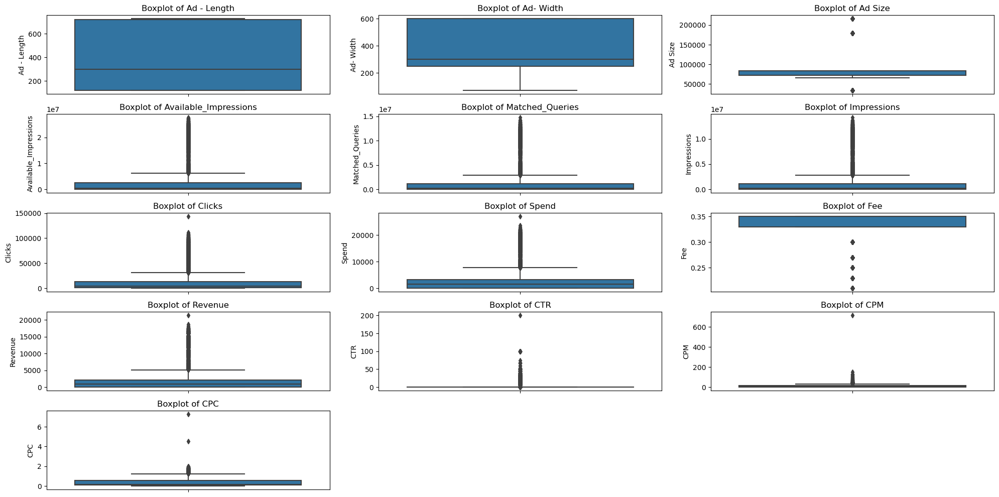

In [224]:
#Check for presence of outliers in each feature
plt.figure(figsize = (20,10))
feature_list = ads_dfnew.columns
for i in range(len(feature_list)):
    plt.subplot(5, 3, i + 1)
    sns.boxplot(y = ads_dfnew[feature_list[i]], data = ads_dfnew)
    plt.title('Boxplot of {}'.format(feature_list[i]))
    plt.tight_layout()

In [225]:
#Define a function which returns the Upper and Lower limit to detect outliers for each feature
def remove_outlier(col):
    Q1,Q3=col.quantile([0.25,0.75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [226]:
#Cap & floor the values beyond the outlier boundaries
for i in feature_list:
    LL, UL = remove_outlier(ads_dfnew[i])
    ads_dfnew[i] = np.where(ads_dfnew[i] > UL, UL, ads_dfnew[i])
    ads_dfnew[i] = np.where(ads_dfnew[i] < LL, LL, ads_dfnew[i])

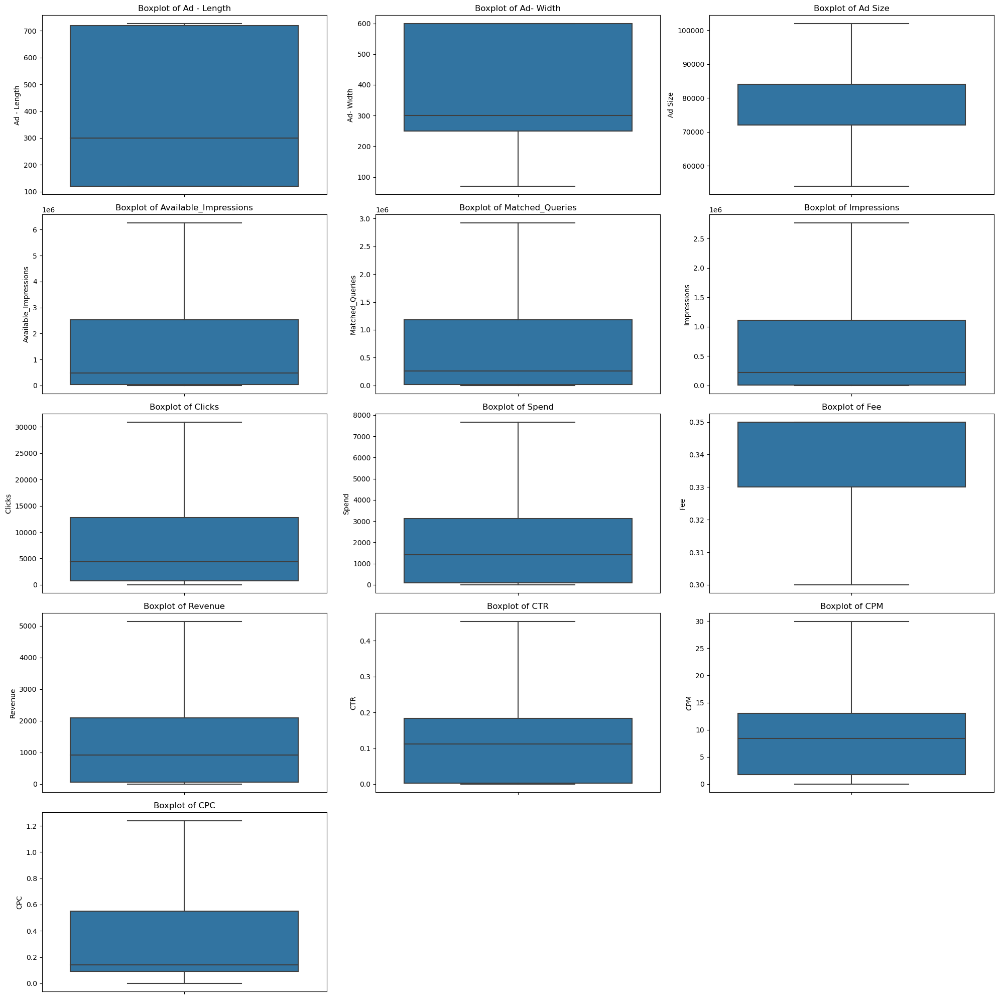

In [227]:
#Check for presence of outliers in each feature
plt.figure(figsize = (20,20))
feature_list = ads_dfnew.columns
for i in range(len(feature_list)):
    plt.subplot(5, 3, i + 1)
    sns.boxplot(y = ads_dfnew[feature_list[i]], data = ads_dfnew)
    plt.title('Boxplot of {}'.format(feature_list[i]))
    plt.tight_layout()

In [228]:
from sklearn.preprocessing import StandardScaler

In [229]:
ss = StandardScaler()
model = ss.fit_transform(ads_dfnew)
model

array([[-0.3644957 , -0.43279676, -0.10251846, ..., -0.89120141,
        -1.19456185, -1.04114024],
       [-0.3644957 , -0.43279676, -0.10251846, ..., -0.88861451,
        -1.19456185, -1.04114024],
       [-0.3644957 , -0.43279676, -0.10251846, ..., -0.89314159,
        -1.19456185, -1.04114024],
       ...,
       [ 1.43309269, -0.18659865,  1.65289551, ...,  2.02710758,
         3.16201634, -0.88350446],
       [-1.13489073,  1.29058999, -0.29756446, ...,  2.02710758,
         3.16201634, -0.82045015],
       [ 1.43309269, -0.18659865,  1.65289551, ...,  2.02710758,
         3.16201634, -0.75739583]])

In [231]:
scaled_adsdf = pd.DataFrame(model, columns = ads_dfnew.columns)
scaled_adsdf.head()

,Ad - Length,Ad- Width,Ad Size,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
0,-0.364496,-0.432797,-0.102518,-0.755333,-0.778949,-0.768478,-0.867488,-0.89317,0.535724,-0.880093,-0.891201,-1.194562,-1.04114
1,-0.364496,-0.432797,-0.102518,-0.755345,-0.778988,-0.768516,-0.867488,-0.89317,0.535724,-0.880093,-0.888615,-1.194562,-1.04114
2,-0.364496,-0.432797,-0.102518,-0.754900,-0.778919,-0.768445,-0.867488,-0.89317,0.535724,-0.880093,-0.893142,-1.194562,-1.04114
3,-0.364496,-0.432797,-0.102518,-0.755040,-0.778781,-0.768302,-0.867488,-0.89317,0.535724,-0.880093,-0.898315,-1.194562,-1.04114
4,-0.364496,-0.432797,-0.102518,-0.755610,-0.779030,-0.768560,-0.867488,-0.89317,0.535724,-0.880093,-0.884734,-1.194562,-1.04114


In [232]:
scaled_adsdf.describe().T

,count,mean,std,min,25%,50%,75%,max
Ad - Length,23066.0,-4.030447e-15,1.000022,-1.134891,-1.134891,-0.364496,1.433093,1.467332
Ad- Width,23066.0,5.390161e-15,1.000022,-1.319110,-0.432797,-0.186599,1.290590,1.290590
Ad Size,23066.0,-4.156304e-15,1.000022,-1.467840,-0.297564,-0.297564,0.482620,1.652896
Available_Impressions,23066.0,-3.617510e-15,1.000022,-0.756182,-0.740341,-0.528577,0.433059,2.193158
Matched_Queries,23066.0,1.341008e-15,1.000022,-0.779265,-0.761447,-0.527722,0.371498,2.070914
Impressions,23066.0,-1.224345e-15,1.000022,-0.768806,-0.760655,-0.538975,0.366051,2.056111
Clicks,23066.0,1.960656e-15,1.000022,-0.867488,-0.793438,-0.405431,0.468629,2.361729
Spend,23066.0,1.250852e-15,1.000022,-0.893170,-0.858046,-0.305523,0.393932,2.271900
Fee,23066.0,-2.322121e-14,1.000022,-2.222416,-0.567532,0.535724,0.535724,0.535724
Revenue,23066.0,3.136228e-15,1.000022,-0.880093,-0.846474,-0.317607,0.389803,2.244218


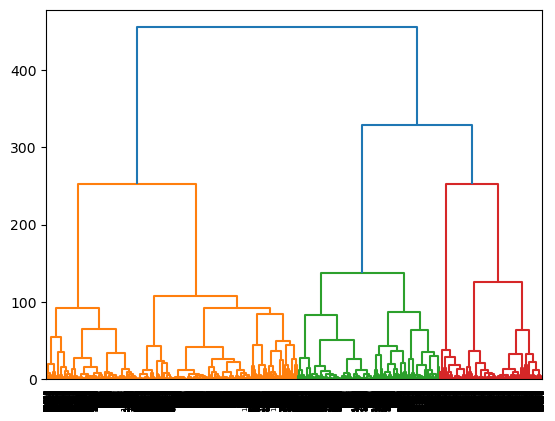

In [56]:
#hierarchical dendrogram using ward and euclidean
from scipy.cluster.hierarchy import dendrogram, linkage

model = linkage(scaled_adsdf, method = 'ward')
dend = dendrogram(model)

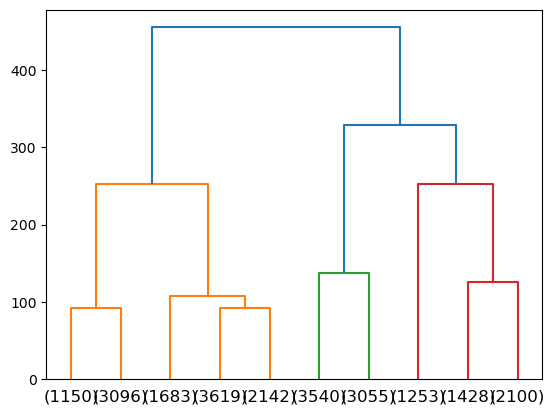

In [59]:
dend = dendrogram(model, truncate_mode = 'lastp', p = 10)

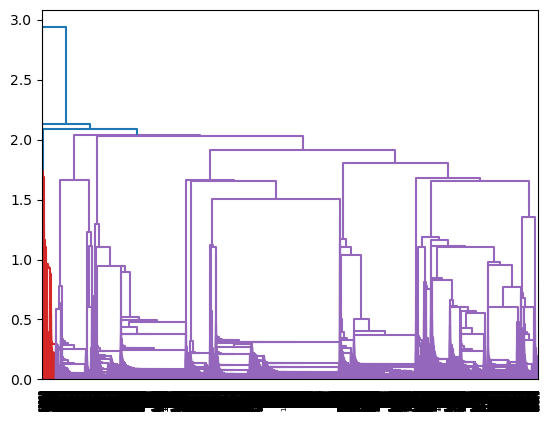

In [234]:
#hierarchical dendrogram using euclidean distance

euc_model = linkage(scaled_adsdf, metric = 'euclidean')
dend = dendrogram(euc_model)

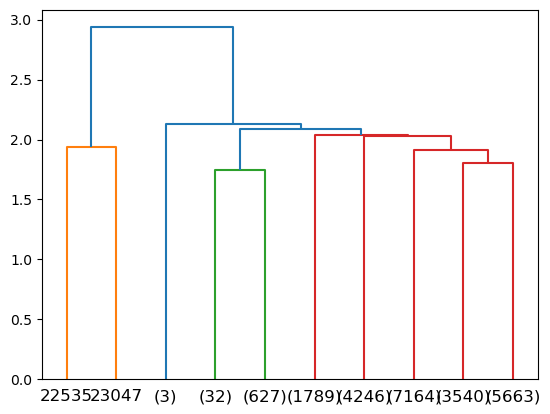

In [62]:
dend = dendrogram(euc_model, truncate_mode = 'lastp', p = 10)

In [63]:
#elbow plot to find ideal number of clusters for k-means

In [164]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

In [66]:
wss = []
sil_scores = []
for i in range(1,11):
    clustersi = KMeans(n_clusters = i)
    clustersi.fit(scaled_adsdf)
    wss.append(clustersi.inertia_)
    if i > 1:
        sil_scores.append(silhouette_score(scaled_adsdf, clustersi.labels_))

In [67]:
print(wss)

[299858.0000000002, 187902.69603041583, 139992.990699985, 106152.74482972652, 72133.69876717062, 62259.99162498269, 55151.526605915504, 50335.1104285093, 44876.18758686891, 42530.695285179594]


In [68]:
print(sil_scores)

[0.4032032120085151, 0.34546476709156715, 0.41284225649057377, 0.48020783078233054, 0.47613811534407546, 0.4688486998487128, 0.4393009079307379, 0.41411135779630426, 0.40988932630125674]


Text(0.5, 1.0, 'Elbow plot')

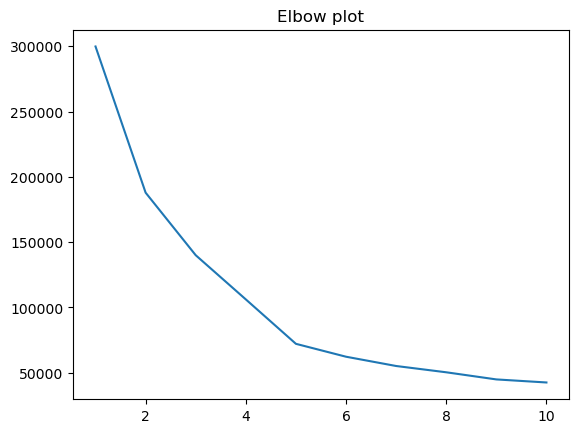

In [69]:
plt.plot(np.arange(1,11), wss);
plt.title('Elbow plot')

In [70]:
#elbow appears to be at 5 so no of clusters is determined to be 5

In [165]:
#calculating KMeans clusters with number of clusters as 5

model = KMeans(n_clusters = 5)
clusters = model.fit(scaled_adsdf)

In [166]:
model.inertia_

72133.69876717062

In [167]:
labels = model.labels_
labels

array([3, 3, 3, ..., 4, 1, 4])

In [168]:
ads_df['ClusterLabel'] = model.labels_

In [169]:
ads_df.head()

,Timestamp,InventoryType,Ad - Length,Ad- Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC,ClusterLabel
0,2020-9-2-17,Format1,300,250,75000,Inter222,Video,Desktop,Display,1806,325,323,1,0.0,0.35,0.0,0.0031,0.0,0.0,3
1,2020-9-2-10,Format1,300,250,75000,Inter227,App,Mobile,Video,1780,285,285,1,0.0,0.35,0.0,0.0035,0.0,0.0,3
2,2020-9-1-22,Format1,300,250,75000,Inter222,Video,Desktop,Display,2727,356,355,1,0.0,0.35,0.0,0.0028,0.0,0.0,3
3,2020-9-3-20,Format1,300,250,75000,Inter228,Video,Mobile,Video,2430,497,495,1,0.0,0.35,0.0,0.0020,0.0,0.0,3
4,2020-9-4-15,Format1,300,250,75000,Inter217,Web,Desktop,Video,1218,242,242,1,0.0,0.35,0.0,0.0041,0.0,0.0,3


In [170]:
ads_df['ClusterLabel'].value_counts()

1    6640
3    6140
4    4698
0    4049
2    1539
Name: ClusterLabel, dtype: int64

In [171]:
#silhouette scores
from sklearn.metrics import silhouette_samples, silhouette_score

In [172]:
sil_score = silhouette_score(scaled_adsdf, labels)
sil_score

0.48020783078233054

In [173]:
clusters4 = KMeans(n_clusters = 4)
clusters4.fit(scaled_adsdf)
labels = clusters4.labels_
sil_score4 = silhouette_score(scaled_adsdf, labels)
sil_score4

0.4032921585940855

In [174]:
clusters6 = KMeans(n_clusters = 6)
clusters6.fit(scaled_adsdf)
labels = clusters6.labels_
sil_score6 = silhouette_score(scaled_adsdf, labels)
sil_score6

0.47613811534407546

In [175]:
#4 and 6 clusters have less sil score compared to 5 clusters so 5 clusters is considered as optimal number

In [176]:
#calculating silhouette samples for each observation and mapping them to observations

sil_samples = silhouette_samples(scaled_adsdf, labels)
ads_df['sil_width'] = sil_samples

In [177]:
#final dataset with cluster assignments and sil widths
ads_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23066 entries, 0 to 23065
Data columns (total 21 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Timestamp              23066 non-null  object 
 1   InventoryType          23066 non-null  object 
 2   Ad - Length            23066 non-null  int64  
 3   Ad- Width              23066 non-null  int64  
 4   Ad Size                23066 non-null  int64  
 5   Ad Type                23066 non-null  object 
 6   Platform               23066 non-null  object 
 7   Device Type            23066 non-null  object 
 8   Format                 23066 non-null  object 
 9   Available_Impressions  23066 non-null  int64  
 10  Matched_Queries        23066 non-null  int64  
 11  Impressions            23066 non-null  int64  
 12  Clicks                 23066 non-null  int64  
 13  Spend                  23066 non-null  float64
 14  Fee                    23066 non-null  float64
 15  Re

In [178]:
ads_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Ad - Length,23066.0,3.851631e+02,2.336514e+02,120.000000,120.000000,300.000000,7.200000e+02,7.280000e+02
Ad- Width,23066.0,3.378960e+02,2.030929e+02,70.000000,250.000000,300.000000,6.000000e+02,6.000000e+02
Ad Size,23066.0,9.667447e+04,6.153833e+04,33600.000000,72000.000000,72000.000000,8.400000e+04,2.160000e+05
Available_Impressions,23066.0,2.432044e+06,4.742888e+06,1.000000,33672.250000,483771.000000,2.527712e+06,2.759286e+07
Matched_Queries,23066.0,1.295099e+06,2.512970e+06,1.000000,18282.500000,258087.500000,1.180700e+06,1.470202e+07
Impressions,23066.0,1.241520e+06,2.429400e+06,1.000000,7990.500000,225290.000000,1.112428e+06,1.419477e+07
Clicks,23066.0,1.067852e+04,1.735341e+04,1.000000,710.000000,4425.000000,1.279375e+04,1.430490e+05
Spend,23066.0,2.706626e+03,4.067927e+03,0.000000,85.180000,1425.125000,3.121400e+03,2.693187e+04
Fee,23066.0,3.351231e-01,3.196322e-02,0.210000,0.330000,0.350000,3.500000e-01,3.500000e-01
Revenue,23066.0,1.924252e+03,3.105238e+03,0.000000,55.365375,926.335000,2.091338e+03,2.127618e+04


In [179]:
ads_df.groupby(by = 'ClusterLabel').mean()

,Ad - Length,Ad- Width,Ad Size,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC,sil_width
ClusterLabel,,,,,,,,,,,,,,
0,465.880958,199.212151,75205.058039,1.039627e+07,5.630305e+06,5.451651e+06,11253.998024,8653.044280,0.290385,6378.676694,0.034171,1.572871,0.760704,0.491774
1,146.024096,568.373494,77139.759036,3.648993e+04,2.181334e+04,1.566770e+04,1888.464759,210.052837,0.349991,136.562174,5.327328,14.448043,0.104421,0.511863
2,141.543860,572.482131,75680.311891,8.055940e+05,5.663903e+05,4.777502e+05,65260.276803,6985.407472,0.288356,5013.785448,2.208029,15.390007,0.111935,0.630763
3,424.471010,146.286645,53525.081433,1.838272e+06,8.784161e+05,8.398711e+05,3304.398860,1524.047645,0.349235,993.095081,0.062518,1.805692,0.552427,0.400890
4,682.020434,305.246914,206058.748404,2.626464e+05,1.416907e+05,1.207011e+05,14363.409110,1254.130773,0.349544,816.719858,4.474371,12.048371,0.091019,0.459862


In [181]:
ads_df.to_csv('Clean_Ad_Clusters.csv')

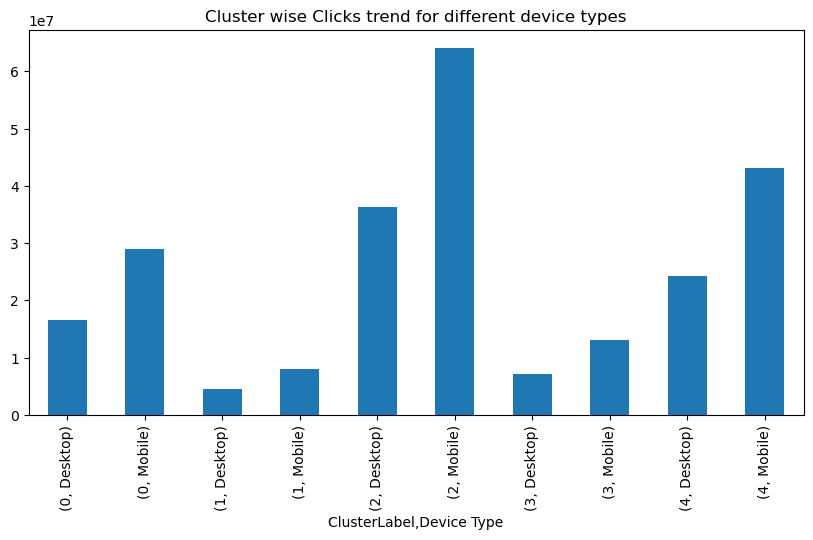

In [200]:
#profile ads based of optimum number of clusters
plt.title('Cluster wise Clicks trend for different device types')
ads_df.groupby(['ClusterLabel','Device Type']).sum()['Clicks'].plot(kind='bar',figsize=(10,5));

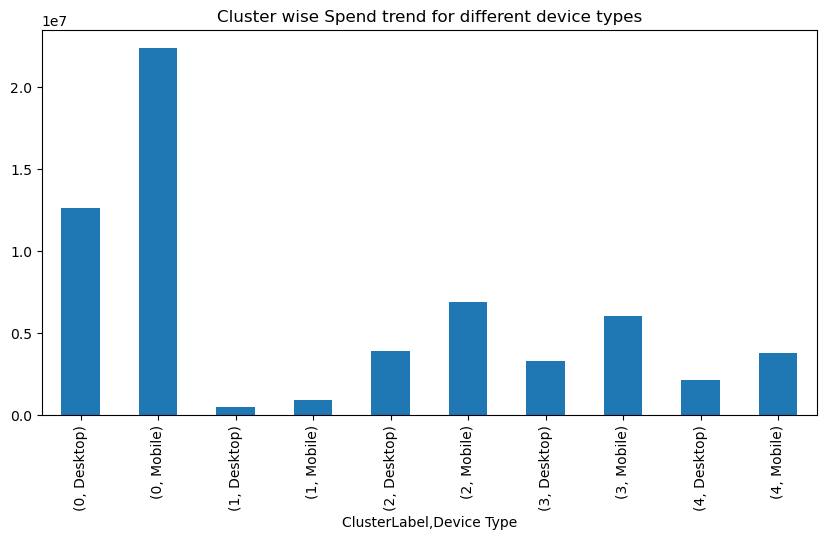

In [201]:
plt.figure(figsize = (5,5))
plt.title('Cluster wise Spend trend for different device types')
ads_df.groupby(['ClusterLabel','Device Type']).sum()['Spend'].plot(kind='bar',figsize=(10,5));

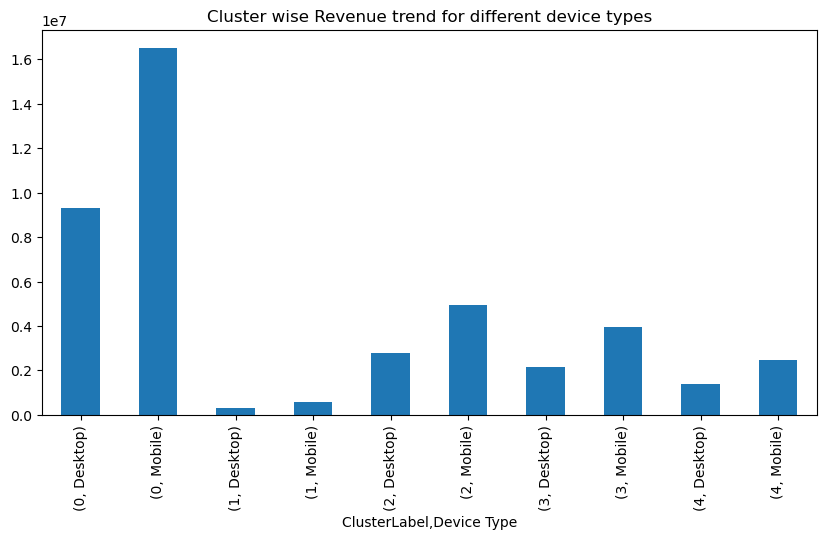

In [202]:
plt.title('Cluster wise Revenue trend for different device types')
ads_df.groupby(['ClusterLabel','Device Type']).sum()['Revenue'].plot(kind='bar',figsize=(10,5));

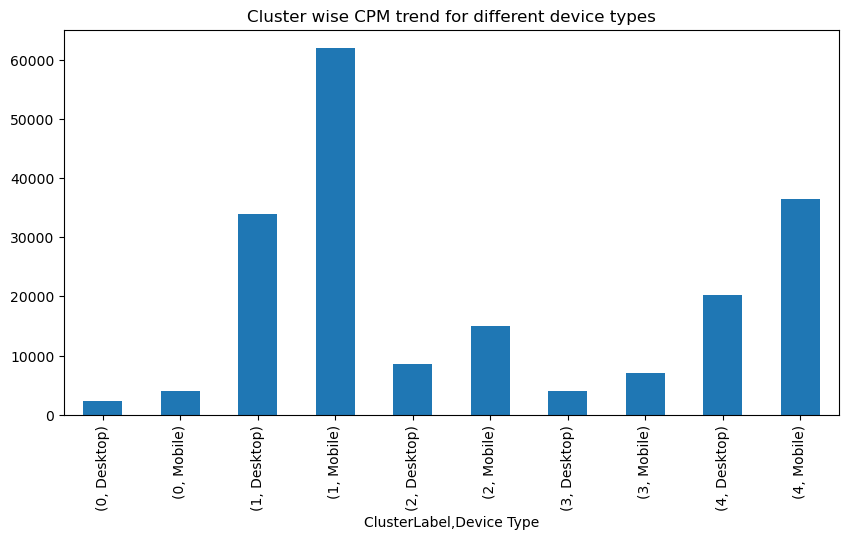

In [203]:
plt.title('Cluster wise CPM trend for different device types')
ads_df.groupby(['ClusterLabel','Device Type']).sum()['CPM'].plot(kind='bar',figsize=(10, 5));

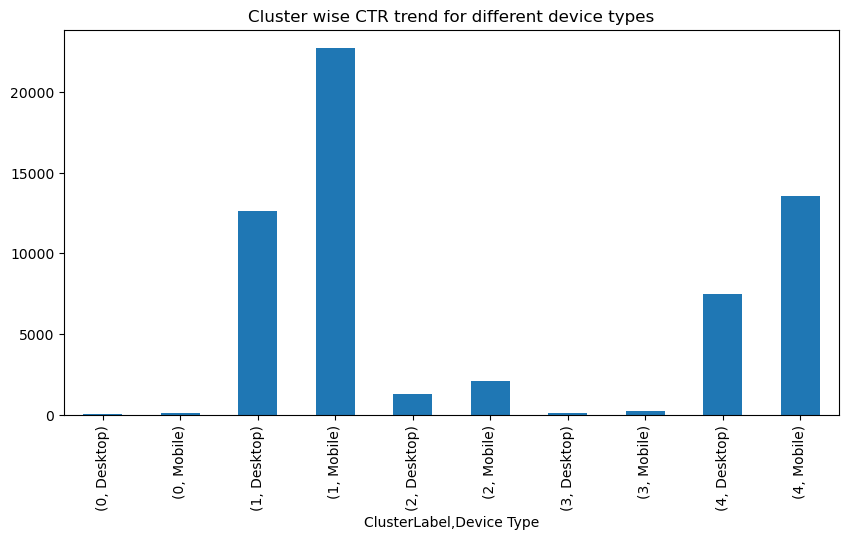

In [204]:
plt.title('Cluster wise CTR trend for different device types')
ads_df.groupby(['ClusterLabel','Device Type']).sum()['CTR'].plot(kind='bar',figsize=(10,5));

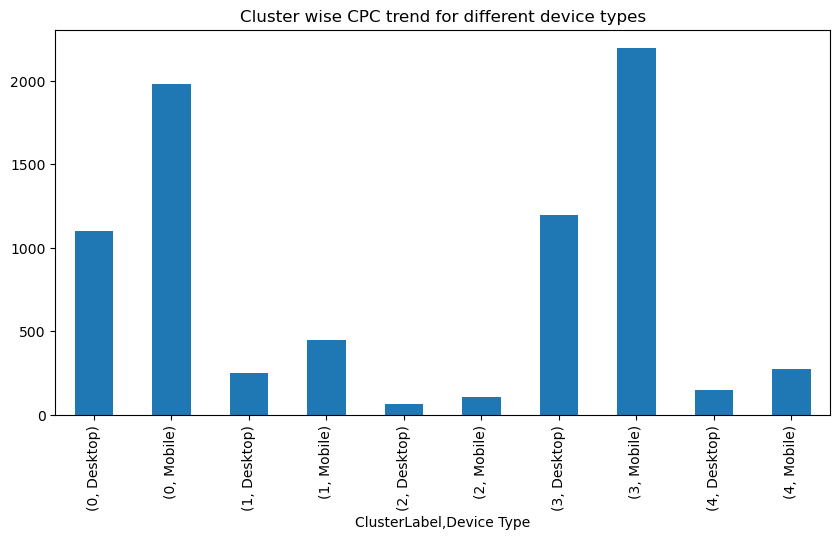

In [205]:
plt.title('Cluster wise CPC trend for different device types')
ads_df.groupby(['ClusterLabel','Device Type']).sum()['CPC'].plot(kind='bar',figsize=(10, 5));

In [194]:
#conclusion for k-means

In [2]:
############ PCA

In [3]:
census = pd.read_excel('PCA+India+Data_Census.xlsx')

In [4]:
census.head()

,State Code,Dist.Code,State,Area Name,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,1,1,Jammu & Kashmir,Kupwara,7707,23388,29796,5862,6196,3,...,1150,749,180,237,680,252,32,46,258,214
1,1,2,Jammu & Kashmir,Badgam,6218,19585,23102,4482,3733,7,...,525,715,123,229,186,148,76,178,140,160
2,1,3,Jammu & Kashmir,Leh(Ladakh),4452,6546,10964,1082,1018,3,...,114,188,44,89,3,34,0,4,67,61
3,1,4,Jammu & Kashmir,Kargil,1320,2784,4206,563,677,0,...,194,247,61,128,13,50,4,10,116,59
4,1,5,Jammu & Kashmir,Punch,11654,20591,29981,5157,4587,20,...,874,1928,465,1043,205,302,24,105,180,478


In [5]:
census.tail()

,State Code,Dist.Code,State,Area Name,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
635,34,636,Puducherry,Mahe,3333,8154,11781,1146,1203,21,...,32,47,0,0,0,0,0,0,32,47
636,34,637,Puducherry,Karaikal,10612,12346,21691,1544,1533,2234,...,155,337,3,14,38,130,4,23,110,170
637,35,638,Andaman & Nicobar Island,Nicobars,1275,1549,2630,227,225,0,...,104,134,9,4,2,6,17,47,76,77
638,35,639,Andaman & Nicobar Island,North & Middle Andaman,3762,5200,8012,723,664,0,...,136,172,24,44,11,21,1,4,100,103
639,35,640,Andaman & Nicobar Island,South Andaman,7975,11977,18049,1470,1358,0,...,173,122,6,2,17,17,2,4,148,99


In [6]:
census.shape

(640, 61)

In [7]:
census.size

39040

In [8]:
#info of the table
census.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 640 entries, 0 to 639
Data columns (total 61 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   State Code      640 non-null    int64 
 1   Dist.Code       640 non-null    int64 
 2   State           640 non-null    object
 3   Area Name       640 non-null    object
 4   No_HH           640 non-null    int64 
 5   TOT_M           640 non-null    int64 
 6   TOT_F           640 non-null    int64 
 7   M_06            640 non-null    int64 
 8   F_06            640 non-null    int64 
 9   M_SC            640 non-null    int64 
 10  F_SC            640 non-null    int64 
 11  M_ST            640 non-null    int64 
 12  F_ST            640 non-null    int64 
 13  M_LIT           640 non-null    int64 
 14  F_LIT           640 non-null    int64 
 15  M_ILL           640 non-null    int64 
 16  F_ILL           640 non-null    int64 
 17  TOT_WORK_M      640 non-null    int64 
 18  TOT_WORK_F

In [9]:
census['State Code'] = census['State Code'].astype('object')
census['Dist.Code'] = census['Dist.Code'].astype('object')

In [10]:
census.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 640 entries, 0 to 639
Data columns (total 61 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   State Code      640 non-null    object
 1   Dist.Code       640 non-null    object
 2   State           640 non-null    object
 3   Area Name       640 non-null    object
 4   No_HH           640 non-null    int64 
 5   TOT_M           640 non-null    int64 
 6   TOT_F           640 non-null    int64 
 7   M_06            640 non-null    int64 
 8   F_06            640 non-null    int64 
 9   M_SC            640 non-null    int64 
 10  F_SC            640 non-null    int64 
 11  M_ST            640 non-null    int64 
 12  F_ST            640 non-null    int64 
 13  M_LIT           640 non-null    int64 
 14  F_LIT           640 non-null    int64 
 15  M_ILL           640 non-null    int64 
 16  F_ILL           640 non-null    int64 
 17  TOT_WORK_M      640 non-null    int64 
 18  TOT_WORK_F

In [11]:
#check the number of rows and columns
census.shape

(640, 61)

In [12]:
#check for any null values
count = 0
for i in census.columns:
    count = count + 1
    if census[i].isnull().sum() > 0:
        print(census[i])
        break
if count >= census.shape[1]:
    print("No columns have null values")
    

No columns have null values


In [13]:
#check for duplicates 
census.duplicated().sum()
#no duplicates

0

In [14]:
pd.set_option('display.max_rows', 61)
census.describe().T

,count,mean,std,min,25%,50%,75%,max
No_HH,640.0,51222.871875,48135.405475,350.0,19484.00,35837.0,68892.00,310450.0
TOT_M,640.0,79940.576563,73384.511114,391.0,30228.00,58339.0,107918.50,485417.0
TOT_F,640.0,122372.084375,113600.717282,698.0,46517.75,87724.5,164251.75,750392.0
M_06,640.0,12309.098438,11500.906881,56.0,4733.75,9159.0,16520.25,96223.0
F_06,640.0,11942.300000,11326.294567,56.0,4672.25,8663.0,15902.25,95129.0
M_SC,640.0,13820.946875,14426.373130,0.0,3466.25,9591.5,19429.75,103307.0
F_SC,640.0,20778.392188,21727.887713,0.0,5603.25,13709.0,29180.00,156429.0
M_ST,640.0,6191.807813,9912.668948,0.0,293.75,2333.5,7658.00,96785.0
F_ST,640.0,10155.640625,15875.701488,0.0,429.50,3834.5,12480.25,130119.0
M_LIT,640.0,57967.979688,55910.282466,286.0,21298.00,42693.5,77989.50,403261.0


PCA: Perform detailed Exploratory analysis by creating certain questions like (i) Which state has highest gender ratio and which has the lowest? (ii) Which district has the highest & lowest gender ratio? (Example Questions). Pick 5 variables out of the given 24 variables below for EDA: No_HH, TOT_M, TOT_F, M_06, F_06, M_SC, F_SC, M_ST, F_ST, M_LIT, F_LIT, M_ILL, F_ILL, TOT_WORK_M, TOT_WORK_F, MAINWORK_M, MAINWORK_F, MAIN_CL_M, MAIN_CL_F, MAIN_AL_M, MAIN_AL_F, MAIN_HH_M, MAIN_HH_F, MAIN_OT_M, MAIN_OT_F

#what to do for this? 
Pick only  any  5  variables out of the  given  24 variables  in the rubric  and perform EDA. For those 5 variables, you may create as many questions as you like those given as example questions in the rubric and perform EDA to find the answers for those.

In [15]:
eda_census = census[['State', 'Area Name', 'No_HH', 'TOT_M', 'TOT_F', 'M_LIT', 'F_LIT', 'M_ILL', 'F_ILL']]

In [16]:
eda_census.shape

(640, 9)

In [17]:
eda_census.head()

,State,Area Name,No_HH,TOT_M,TOT_F,M_LIT,F_LIT,M_ILL,F_ILL
0,Jammu & Kashmir,Kupwara,7707,23388,29796,13381,11364,10007,18432
1,Jammu & Kashmir,Badgam,6218,19585,23102,10513,7891,9072,15211
2,Jammu & Kashmir,Leh(Ladakh),4452,6546,10964,4534,5840,2012,5124
3,Jammu & Kashmir,Kargil,1320,2784,4206,1842,1962,942,2244
4,Jammu & Kashmir,Punch,11654,20591,29981,13243,13477,7348,16504


In [18]:
eda_census.tail()

,State,Area Name,No_HH,TOT_M,TOT_F,M_LIT,F_LIT,M_ILL,F_ILL
635,Puducherry,Mahe,3333,8154,11781,6916,10184,1238,1597
636,Puducherry,Karaikal,10612,12346,21691,10292,14225,2054,7466
637,Andaman & Nicobar Island,Nicobars,1275,1549,2630,1187,1602,362,1028
638,Andaman & Nicobar Island,North & Middle Andaman,3762,5200,8012,4206,5273,994,2739
639,Andaman & Nicobar Island,South Andaman,7975,11977,18049,10095,13362,1882,4687


In [19]:
eda_census['Total_MF_Ratio'] = round(eda_census['TOT_M']/eda_census['TOT_F'],2)
eda_census['Total_MF_Ratio']

C:\Users\yamin\AppData\Local\Temp\ipykernel_4072\3413971548.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eda_census['Total_MF_Ratio'] = round(eda_census['TOT_M']/eda_census['TOT_F'],2)


0      0.78
1      0.85
2      0.60
3      0.66
4      0.69
       ... 
635    0.69
636    0.57
637    0.59
638    0.65
639    0.66
Name: Total_MF_Ratio, Length: 640, dtype: float64

In [20]:
eda_census.groupby(['State','Area Name']).mean()['Total_MF_Ratio'].sort_values(ascending=False)

State            Area Name     
Lakshadweep      Lakshadweep       0.87
Uttar Pradesh    Mahamaya Nagar    0.85
Rajasthan        Dhaulpur          0.85
Jammu & Kashmir  Badgam            0.85
Uttar Pradesh    Baghpat           0.84
                                   ... 
Tamil Nadu       Erode             0.45
Odisha           Baudh             0.45
Tamil Nadu       Virudhunagar      0.45
Andhra Pradesh   Krishna           0.44
Odisha           Koraput           0.44
Name: Total_MF_Ratio, Length: 640, dtype: float64

In [21]:
eda_census.head()

,State,Area Name,No_HH,TOT_M,TOT_F,M_LIT,F_LIT,M_ILL,F_ILL,Total_MF_Ratio
0,Jammu & Kashmir,Kupwara,7707,23388,29796,13381,11364,10007,18432,0.78
1,Jammu & Kashmir,Badgam,6218,19585,23102,10513,7891,9072,15211,0.85
2,Jammu & Kashmir,Leh(Ladakh),4452,6546,10964,4534,5840,2012,5124,0.60
3,Jammu & Kashmir,Kargil,1320,2784,4206,1842,1962,942,2244,0.66
4,Jammu & Kashmir,Punch,11654,20591,29981,13243,13477,7348,16504,0.69


In [22]:
#Univariate analysis by plotting boxplots.
plt.figure(figsize = (60,450))
feature_list = eda_census.select_dtypes(include = ['int64']).columns
for i in range(len(feature_list)):
    plt.subplot(20, 1, i + 1)
    sns.boxplot(y = eda_census[feature_list[i]], data = eda_census)
    plt.title('Boxplot of {}'.format(feature_list[i]))
    plt.tight_layout()

In [23]:
#Bivariate analysis by plotting scatter plots of all numeric variables.
plt.figure(figsize = (60,450))
feature_list = eda_census.select_dtypes(include = ['int64']).columns
for i in range(len(feature_list)):
    for j in range(len(feature_list)):
        plt.subplot(20, 2, i + 1)
        sns.scatterplot(x = eda_census[feature_list[i]], y = eda_census[feature_list[j]], data = eda_census)
        plt.title('Pairplot of {} {}'.format(feature_list[i], feature_list[j]))
        plt.tight_layout()

In [24]:
eda_census.describe().T

,count,mean,std,min,25%,50%,75%,max
No_HH,640.0,51222.871875,48135.405475,350.00,19484.00,35837.00,68892.00,310450.00
TOT_M,640.0,79940.576563,73384.511114,391.00,30228.00,58339.00,107918.50,485417.00
TOT_F,640.0,122372.084375,113600.717282,698.00,46517.75,87724.50,164251.75,750392.00
M_LIT,640.0,57967.979688,55910.282466,286.00,21298.00,42693.50,77989.50,403261.00
F_LIT,640.0,66359.565625,75037.860207,371.00,20932.00,43796.50,84799.75,571140.00
M_ILL,640.0,21972.596875,19825.605268,105.00,8590.00,15767.50,29512.50,105961.00
F_ILL,640.0,56012.518750,47116.693769,327.00,22367.00,42386.00,78471.00,254160.00
Total_MF_Ratio,640.0,0.656922,0.091645,0.44,0.59,0.66,0.73,0.87


In [112]:
eda_statewise = eda_census.groupby('State').sum().reset_index()

In [113]:
#1. Which is the state with highest number of households
#2. Top 3 states with most literate people either male/female
#3. State with highest number and least number of illiterate people.
#4. Ratio of male to female across different states.
#5. District with most number of literates.
#6. District with most number of illiterates.


In [114]:
eda_statewise.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35 entries, 0 to 34
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   State           35 non-null     object 
 1   No_HH           35 non-null     int64  
 2   TOT_M           35 non-null     int64  
 3   TOT_F           35 non-null     int64  
 4   M_LIT           35 non-null     int64  
 5   F_LIT           35 non-null     int64  
 6   M_ILL           35 non-null     int64  
 7   F_ILL           35 non-null     int64  
 8   Total_MF_Ratio  35 non-null     float64
dtypes: float64(1), int64(7), object(1)
memory usage: 2.6+ KB


In [115]:
eda_statewise.sort_values(by = 'No_HH', inplace = True, ascending = False)
eda_statewise

,State,No_HH,TOT_M,TOT_F,M_LIT,F_LIT,M_ILL,F_ILL,Total_MF_Ratio
32,Uttar Pradesh,4006871,9043969,12023885,6016402,5574752,3027567,6449133,54.08
19,Maharashtra,3136214,4196130,7138557,3308633,4619012,887497,2519545,20.14
1,Andhra Pradesh,3127287,3274363,6097235,2372971,2678603,901392,3418632,12.29
30,Tamil Nadu,2964700,3074009,5610310,2485404,3205093,588605,2405217,17.37
34,West Bengal,2615284,3912553,6016118,2932621,3479316,979932,2536802,12.32
15,Karnataka,2268615,3409482,5345675,2554163,2905370,855319,2440305,19.11
16,Kerala,1982663,2919825,4856357,2370331,3878204,549494,978153,8.30
4,Bihar,1974627,4025198,5405883,2408492,2197931,1616706,3207952,28.35
18,Madhya Pradesh,1503764,2155608,3369745,1537129,1656596,618479,1713149,31.73
10,Gujarat,1235200,1983685,2939472,1509399,1722877,474286,1216595,17.20


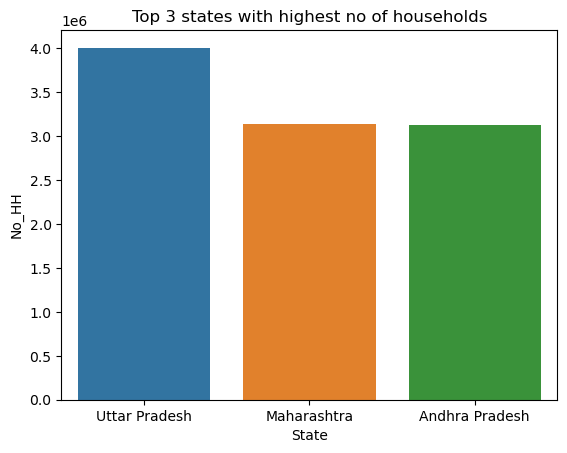

In [117]:
#count plot showing no of households in top 10 states
plt.title('Top 3 states with highest no of households')
sns.barplot(x = 'State', y = 'No_HH', data = eda_statewise[:3]);

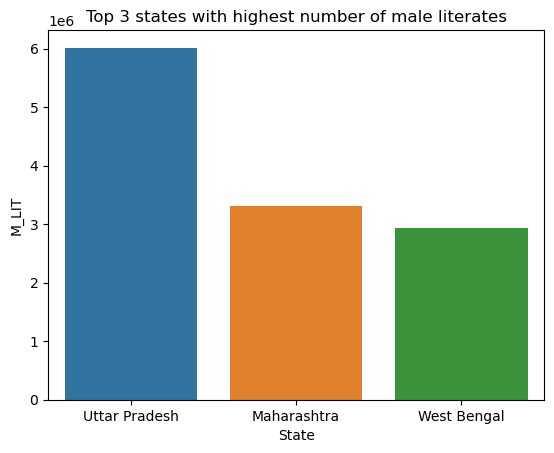

In [132]:
plt.title('Top 3 states with highest number of male literates')
sns.barplot(x = 'State', y = 'M_LIT', data = eda_statewise.sort_values(by = 'M_LIT', ascending = False).reset_index()[0:3]);

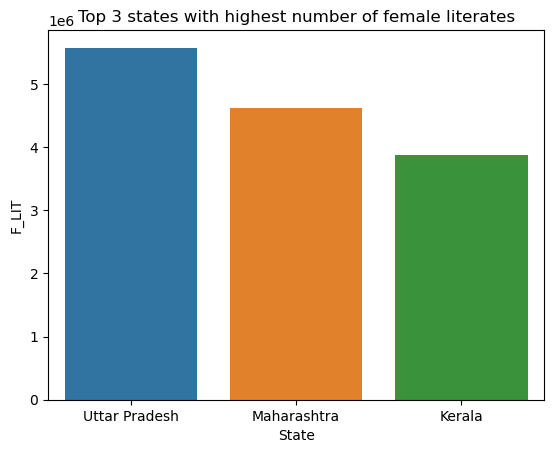

In [134]:
plt.title('Top 3 states with highest number of female literates')
sns.barplot(x = 'State', y = 'F_LIT', data = eda_statewise.sort_values(by = 'F_LIT', ascending = False).reset_index()[0:3]);

In [124]:
eda_statewise['Total_ill_byState'] = eda_statewise['M_ILL'] + eda_statewise['F_ILL']

In [125]:
eda_statewise.sort_values(by = 'Total_ill_byState', ascending = False).reset_index()

,index,State,No_HH,TOT_M,TOT_F,M_LIT,F_LIT,M_ILL,F_ILL,Total_MF_Ratio,Total_ill_byState
0,32,Uttar Pradesh,4006871,9043969,12023885,6016402,5574752,3027567,6449133,54.08,9476700
1,4,Bihar,1974627,4025198,5405883,2408492,2197931,1616706,3207952,28.35,4824658
2,1,Andhra Pradesh,3127287,3274363,6097235,2372971,2678603,901392,3418632,12.29,4320024
3,34,West Bengal,2615284,3912553,6016118,2932621,3479316,979932,2536802,12.32,3516734
4,19,Maharashtra,3136214,4196130,7138557,3308633,4619012,887497,2519545,20.14,3407042
5,15,Karnataka,2268615,3409482,5345675,2554163,2905370,855319,2440305,19.11,3295624
6,30,Tamil Nadu,2964700,3074009,5610310,2485404,3205093,588605,2405217,17.37,2993822
7,18,Madhya Pradesh,1503764,2155608,3369745,1537129,1656596,618479,1713149,31.73,2331628
8,28,Rajasthan,1177124,2062563,2966496,1450321,1313776,612242,1652720,22.71,2264962
9,10,Gujarat,1235200,1983685,2939472,1509399,1722877,474286,1216595,17.20,1690881


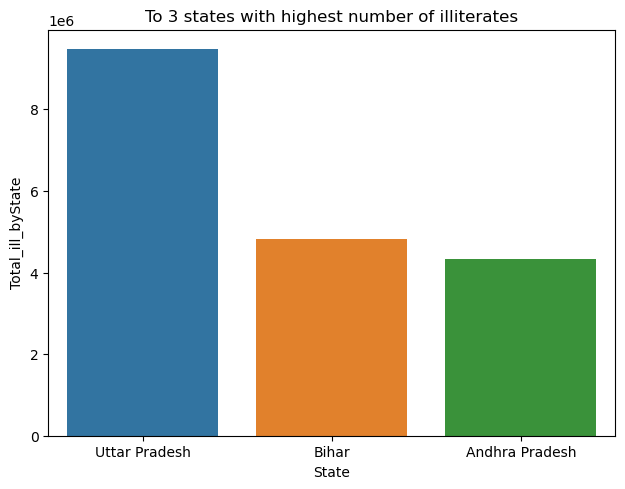

In [131]:
plt.title('To 3 states with highest number of illiterates')
sns.barplot(x = 'State', y = 'Total_ill_byState', data = eda_statewise.sort_values(by = 'Total_ill_byState', ascending = False).reset_index()[0:3]);

In [95]:
eda_district_wise = eda_census.groupby(['State', 'Area Name']).sum().reset_index()

In [97]:
eda_district_wise.head()

,State,Area Name,No_HH,TOT_M,TOT_F,M_LIT,F_LIT,M_ILL,F_ILL,Total_MF_Ratio
0,Andaman & Nicobar Island,Nicobars,1275,1549,2630,1187,1602,362,1028,0.59
1,Andaman & Nicobar Island,North & Middle Andaman,3762,5200,8012,4206,5273,994,2739,0.65
2,Andaman & Nicobar Island,South Andaman,7975,11977,18049,10095,13362,1882,4687,0.66
3,Andhra Pradesh,Adilabad,94688,101731,190498,73614,70331,28117,120167,0.53
4,Andhra Pradesh,Anantapur,136981,166067,284209,115905,114500,50162,169709,0.58


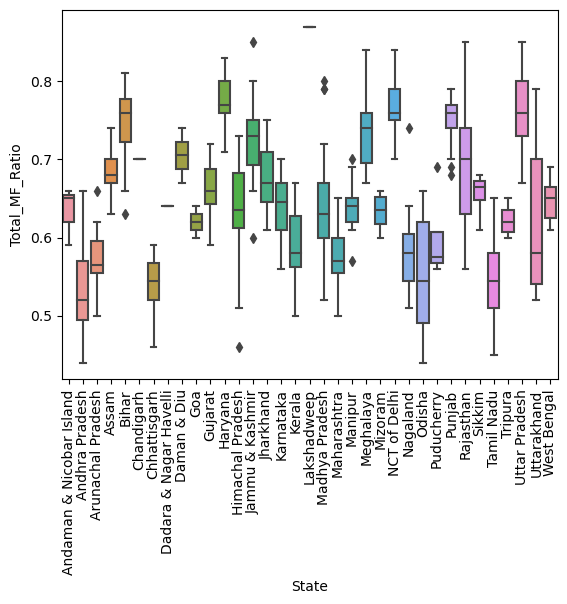

In [99]:
plt.xticks(rotation = 90)
sns.boxplot(y = 'Total_MF_Ratio', x = 'State', data = eda_district_wise);

In [137]:
#State with least male to female ratio
eda_statewise.sort_values(by = 'Total_MF_Ratio').head(1)['State']

7    Dadara & Nagar Havelli
Name: State, dtype: object

In [138]:
#State with highest male to female ratio
eda_statewise.sort_values(by = 'Total_MF_Ratio').tail(1)['State']

32    Uttar Pradesh
Name: State, dtype: object

In [100]:
eda_district_wise['Total_literates_by_district'] = eda_district_wise['M_LIT'] + eda_district_wise['F_LIT']

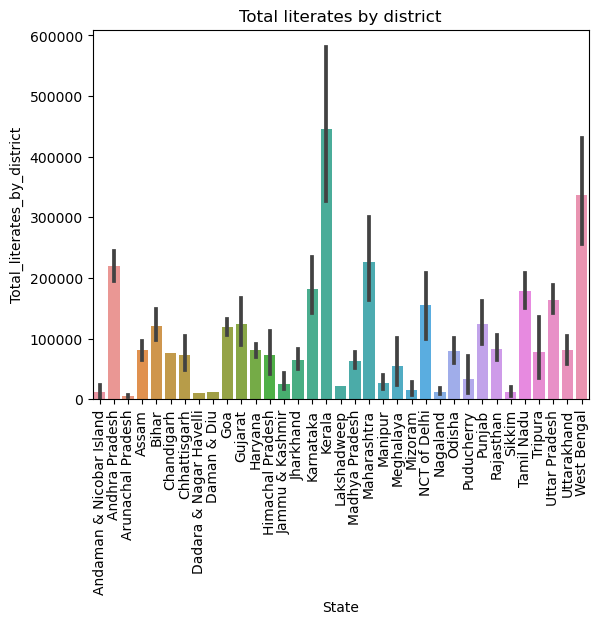

In [107]:
plt.xticks(rotation = 90)
plt.title('Total literates by district')
sns.barplot(y = 'Total_literates_by_district', x = 'State', data = eda_district_wise);

#PCA: We choose not to treat outliers for this case. Do you think that treating outliers for this case is necessary?

Treating outliers is based on business problem. Decision whether to treat outliers and which method to use when treating outliers depends on our ultimate goal of the business problem and our objective. In this case, treating outliers is necessary as the populations or counts of all segments of all people may not be in comparable range and this can effect the calculation of principal components.

In [19]:
#drop object type columns as they are not useful for clustering
census_int = census.select_dtypes(exclude = ['object'])
census_int.head(5)

,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,F_SC,M_ST,F_ST,M_LIT,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,7707,23388,29796,5862,6196,3,0,1999,2598,13381,...,1150,749,180,237,680,252,32,46,258,214
1,6218,19585,23102,4482,3733,7,6,427,517,10513,...,525,715,123,229,186,148,76,178,140,160
2,4452,6546,10964,1082,1018,3,6,5806,9723,4534,...,114,188,44,89,3,34,0,4,67,61
3,1320,2784,4206,563,677,0,0,2666,3968,1842,...,194,247,61,128,13,50,4,10,116,59
4,11654,20591,29981,5157,4587,20,33,7670,10843,13243,...,874,1928,465,1043,205,302,24,105,180,478


In [20]:
#Check for presence of outliers in each feature
plt.figure(figsize = (60,450))
feature_list = census_int.columns
for i in range(len(feature_list)):
    plt.subplot(20, 3, i + 1)
    sns.boxplot(y = census_int[feature_list[i]], data = census_int)
    plt.title('Boxplot of {}'.format(feature_list[i]))
    plt.tight_layout()

In [21]:
from scipy.stats import zscore
census_int_scaled = census_int.apply(zscore)

In [22]:
census_int_scaled.head()

,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,F_SC,M_ST,F_ST,M_LIT,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,-0.904738,-0.771236,-0.815563,-0.561012,-0.507738,-0.958575,-0.957049,-0.423306,-0.476423,-0.798097,...,-0.163229,-0.720610,-0.156494,-0.287524,0.156577,-0.657412,-0.365258,-0.499977,-0.413053,-0.539614
1,-0.935695,-0.823100,-0.874534,-0.681096,-0.725367,-0.958297,-0.956772,-0.582014,-0.607607,-0.849434,...,-0.583103,-0.732811,-0.282327,-0.294688,-0.491731,-0.723062,0.042855,-0.073481,-0.606455,-0.598988
2,-0.972412,-1.000919,-0.981466,-0.976956,-0.965262,-0.958575,-0.956772,-0.038951,-0.027273,-0.956457,...,-0.859212,-0.921931,-0.456727,-0.420050,-0.731894,-0.795026,-0.662068,-0.635680,-0.726103,-0.707839
3,-1.037530,-1.052224,-1.041001,-1.022118,-0.995393,-0.958783,-0.957049,-0.355965,-0.390060,-1.004643,...,-0.805468,-0.900758,-0.419198,-0.385127,-0.718770,-0.784926,-0.624966,-0.616294,-0.645791,-0.710038
4,-0.822676,-0.809381,-0.813933,-0.622359,-0.649908,-0.957395,-0.955529,0.149238,0.043330,-0.800568,...,-0.348645,-0.297513,0.472670,0.434200,-0.466796,-0.625849,-0.439461,-0.309346,-0.540895,-0.249344


In [23]:
#Check for presence of outliers in each feature
plt.figure(figsize = (60,200))
feature_list = census_int_scaled.columns
for i in range(len(feature_list)):
    plt.subplot(20, 3, i + 1)
    sns.boxplot(y = census_int_scaled[feature_list[i]], data = census_int_scaled)
    plt.title('Boxplot of {}'.format(feature_list[i]))
    plt.tight_layout()

In [24]:
# Scaling does not have impact on the outliers as it is not reducing the magnitude the outliers but bringing all the values to a comparable scale.
# Above are boxplots before and after scaling the data and they show the outliers have not been treated before and after scaling

In [25]:
#PCA: Perform all the required steps for PCA (use sklearn only) Create the covariance Matrix Get eigen values and eigen vector.

#removing outliers and then scaling the data to perform PCA

In [26]:
census_int.head()

,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,F_SC,M_ST,F_ST,M_LIT,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,7707,23388,29796,5862,6196,3,0,1999,2598,13381,...,1150,749,180,237,680,252,32,46,258,214
1,6218,19585,23102,4482,3733,7,6,427,517,10513,...,525,715,123,229,186,148,76,178,140,160
2,4452,6546,10964,1082,1018,3,6,5806,9723,4534,...,114,188,44,89,3,34,0,4,67,61
3,1320,2784,4206,563,677,0,0,2666,3968,1842,...,194,247,61,128,13,50,4,10,116,59
4,11654,20591,29981,5157,4587,20,33,7670,10843,13243,...,874,1928,465,1043,205,302,24,105,180,478


In [27]:
#outlier treatment by capping
def remove_outlier(col):
    Q1, Q3 = col.quantile([0.25, 0.75])
    IQR = Q3 - Q1
    UL = Q3 + (1.5 * IQR)
    LL = Q1 - (1.5 * IQR)
    return LL, UL

In [28]:
for i in census_int.columns:
    LL, UL = remove_outlier(census_int[i])
    census_int[i] = np.where(census_int[i] > UL, UL, census_int[i])
    census_int[i] = np.where(census_int[i] < LL, LL, census_int[i])

In [29]:
#Check for presence of outliers in each feature after outlier treatment by capping to max values.
plt.figure(figsize = (60,200))
feature_list = census_int.columns
for i in range(len(feature_list)):
    plt.subplot(20, 3, i + 1)
    sns.boxplot(y = census_int[feature_list[i]], data = census_int)
    plt.title('Boxplot of {}'.format(feature_list[i]))
    plt.tight_layout()

In [31]:
#scaling the outlier treated data using z-score scaling
#census_int_treated_scaled (ts)
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
model = ss.fit_transform(census_int)

In [32]:
print(census_int.columns)

Index(['No_HH', 'TOT_M', 'TOT_F', 'M_06', 'F_06', 'M_SC', 'F_SC', 'M_ST',
       'F_ST', 'M_LIT', 'F_LIT', 'M_ILL', 'F_ILL', 'TOT_WORK_M', 'TOT_WORK_F',
       'MAINWORK_M', 'MAINWORK_F', 'MAIN_CL_M', 'MAIN_CL_F', 'MAIN_AL_M',
       'MAIN_AL_F', 'MAIN_HH_M', 'MAIN_HH_F', 'MAIN_OT_M', 'MAIN_OT_F',
       'MARGWORK_M', 'MARGWORK_F', 'MARG_CL_M', 'MARG_CL_F', 'MARG_AL_M',
       'MARG_AL_F', 'MARG_HH_M', 'MARG_HH_F', 'MARG_OT_M', 'MARG_OT_F',
       'MARGWORK_3_6_M', 'MARGWORK_3_6_F', 'MARG_CL_3_6_M', 'MARG_CL_3_6_F',
       'MARG_AL_3_6_M', 'MARG_AL_3_6_F', 'MARG_HH_3_6_M', 'MARG_HH_3_6_F',
       'MARG_OT_3_6_M', 'MARG_OT_3_6_F', 'MARGWORK_0_3_M', 'MARGWORK_0_3_F',
       'MARG_CL_0_3_M', 'MARG_CL_0_3_F', 'MARG_AL_0_3_M', 'MARG_AL_0_3_F',
       'MARG_HH_0_3_M', 'MARG_HH_0_3_F', 'MARG_OT_0_3_M', 'MARG_OT_0_3_F',
       'NON_WORK_M', 'NON_WORK_F'],
      dtype='object')


In [33]:
census_int_ts = pd.DataFrame(model, columns = census_int.columns)
census_int_ts.head()

,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,F_SC,M_ST,F_ST,M_LIT,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,-1.038986,-0.874837,-0.937027,-0.624685,-0.561282,-1.080201,-1.079963,-0.510440,-0.574198,-0.939617,...,-0.093587,-0.860882,-0.041800,-0.423378,0.523468,-0.793688,-0.443385,-0.756991,-0.497493,-0.774865
1,-1.076896,-0.938023,-1.009723,-0.773932,-0.835657,-1.079873,-1.079635,-0.771833,-0.782092,-1.005083,...,-0.719169,-0.877096,-0.347040,-0.443790,-0.634478,-0.884805,0.358782,0.088391,-0.813235,-0.880662
2,-1.121858,-1.154665,-1.141539,-1.141642,-1.138104,-1.080201,-1.079635,0.122588,0.137599,-1.141561,...,-1.130551,-1.128423,-0.770091,-0.800999,-1.063434,-0.984684,-1.026779,-1.025976,-1.008568,-1.074622
3,-1.201599,-1.217171,-1.214930,-1.197772,-1.176091,-1.080447,-1.079963,-0.399531,-0.437333,-1.203009,...,-1.050477,-1.100286,-0.679055,-0.701491,-1.039994,-0.970666,-0.953855,-0.987550,-0.877454,-1.078541
4,-0.938495,-0.921309,-0.935018,-0.700931,-0.740523,-1.078807,-1.078160,0.432534,0.249489,-0.942767,...,-0.369844,-0.298617,1.484398,1.633130,-0.589942,-0.749882,-0.589234,-0.379131,-0.706204,-0.257637


In [34]:
census_int_ts.describe().T

,count,mean,std,min,25%,50%,75%,max
No_HH,640.0,-1.516148e-16,1.000782,-1.226295,-0.739143,-0.322796,0.518785,2.405677
TOT_M,640.0,1.457168e-17,1.000782,-1.256930,-0.761190,-0.294128,0.529633,2.465868
TOT_F,640.0,8.881784e-17,1.000782,-1.253026,-0.755432,-0.307934,0.523139,2.440995
M_06,640.0,3.295975e-17,1.000782,-1.252604,-0.746705,-0.268114,0.528005,2.440070
F_06,640.0,-6.626644e-17,1.000782,-1.245270,-0.731026,-0.286462,0.519980,2.396488
M_SC,640.0,-5.342948e-17,1.000782,-1.080447,-0.796150,-0.293766,0.513154,2.477110
F_SC,640.0,8.673617e-17,1.000782,-1.079963,-0.773791,-0.330877,0.514489,2.446907
M_ST,640.0,-9.037909e-17,1.000782,-0.842834,-0.793989,-0.454820,0.430539,2.267331
F_ST,640.0,-1.144917e-16,1.000782,-0.833741,-0.790834,-0.450670,0.413052,2.218881
M_LIT,640.0,-2.040035e-16,1.000782,-1.238527,-0.758902,-0.270522,0.535153,2.476235


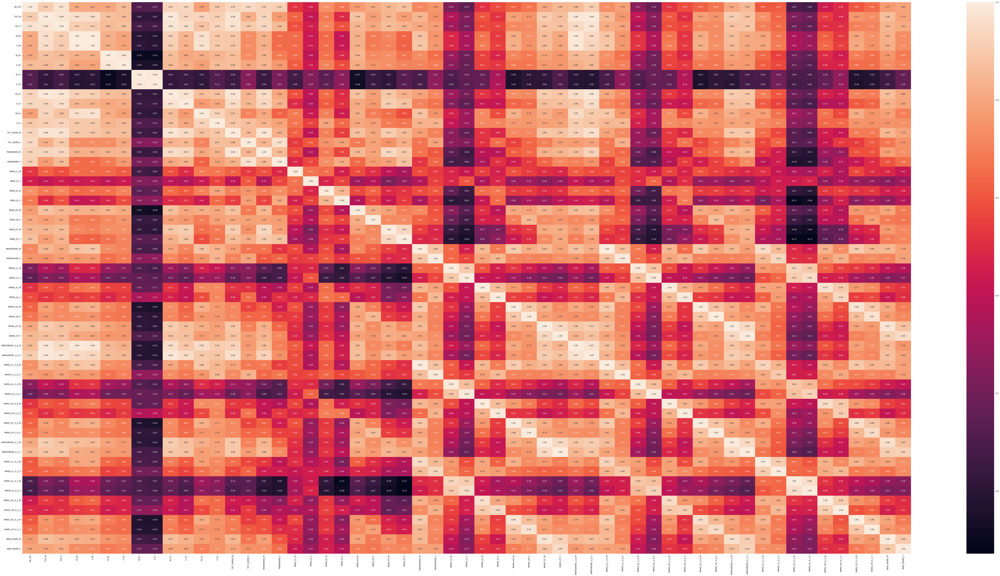

In [35]:
#Check for presence of correlations
plt.figure(figsize = (100,50))
sns.heatmap(census_int_ts.corr(), annot=True,fmt='.2f');

In [36]:
#Confirm the statistical significance of correlations
#H0: Correlations are not significant, H1: There are significant correlations
#Reject H0 if p-value < 0.05
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
chi_square_value,p_value=calculate_bartlett_sphericity(census_int_ts)
p_value

0.0

In [37]:
#Confirm the adequacy of sample size. 
#Note: Above 0.7 is good, below 0.5 is not acceptable
from factor_analyzer.factor_analyzer import calculate_kmo
kmo_all,kmo_model=calculate_kmo(census_int_ts)
kmo_model

C:\Users\yamin\anaconda3\lib\site-packages\factor_analyzer\utils.py:244: UserWarning: The inverse of the variance-covariance matrix was calculated using the Moore-Penrose generalized matrix inversion, due to its determinant being at or very close to zero.
  warnings.warn(


0.9361896166653038

In [38]:
from sklearn.decomposition import PCA

In [39]:
pca_model = PCA(n_components = 57,random_state = 123)
census_int_ts_components = pca_model.fit_transform(census_int_ts)

In [40]:
#extractnig eigen vectors
with np.printoptions(threshold=np.inf):
    print(pca_model.components_)

[[ 1.49221577e-01  1.59169166e-01  1.58209209e-01  1.56340426e-01
   1.56814397e-01  1.43350149e-01  1.43537047e-01  1.88487348e-02
   1.78779679e-02  1.55152388e-01  1.45449842e-01  1.54551103e-01
   1.58283471e-01  1.54076268e-01  1.42529954e-01  1.41932013e-01
   1.25731635e-01  1.11692445e-01  8.30349561e-02  1.19290666e-01
   9.00888127e-02  1.41849693e-01  1.33880110e-01  1.22761803e-01
   1.16865605e-01  1.56656371e-01  1.48694892e-01  8.81634379e-02
   6.51602646e-02  1.27278105e-01  1.15888262e-01  1.45366065e-01
   1.42301824e-01  1.50876751e-01  1.48018459e-01  1.57907614e-01
   1.55831012e-01  1.57640211e-01  1.49501496e-01  9.47851958e-02
   6.71584238e-02  1.28184388e-01  1.13959228e-01  1.45107689e-01
   1.41029417e-01  1.50922323e-01  1.47534162e-01  1.42986750e-01
   1.33783732e-01  6.29639397e-02  5.67405801e-02  1.19101654e-01
   1.13044170e-01  1.42139632e-01  1.41369608e-01  1.47628987e-01
   1.42102627e-01]
 [-1.15486734e-01 -8.02387907e-02 -9.37175061e-02 -2.0340

In [41]:
PC = pd.DataFrame(data = pca_model.components_, columns = census_int_ts.columns)
PC.head()

,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,F_SC,M_ST,F_ST,M_LIT,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,0.149222,0.159169,0.158209,0.156340,0.156814,0.143350,0.143537,0.018849,0.017878,0.155152,...,0.142987,0.133784,0.062964,0.056741,0.119102,0.113044,0.142140,0.141370,0.147629,0.142103
1,-0.115487,-0.080239,-0.093718,-0.020341,-0.014310,-0.079667,-0.087098,0.069101,0.067316,-0.105986,...,0.136839,0.166416,0.281881,0.287541,0.182341,0.177112,0.052925,0.035109,-0.049122,-0.039848
2,0.101528,-0.038662,0.028959,-0.074419,-0.068223,-0.037619,0.021350,0.323827,0.338705,-0.032107,...,-0.103565,0.033423,-0.120293,-0.088097,0.026176,0.164774,-0.144419,-0.102175,-0.126673,-0.028545
3,0.076814,0.052976,0.070022,0.028520,0.016398,0.010210,0.016244,0.091143,0.079554,0.089187,...,-0.018223,0.005954,0.208941,0.240499,-0.240416,-0.189408,-0.167554,-0.169020,0.024036,0.057402
4,-0.012090,-0.042344,-0.022927,-0.080339,-0.078326,-0.167893,-0.158092,0.418412,0.415965,-0.014033,...,0.094293,0.112351,-0.018070,-0.036293,0.016981,0.047538,0.014187,0.047504,0.191790,0.249765


In [42]:
#extracting the eigen values
pca_model.explained_variance_

array([3.56488638e+01, 7.64357559e+00, 3.76919551e+00, 2.77722349e+00,
       1.90694892e+00, 1.15490310e+00, 9.87726707e-01, 4.64629906e-01,
       3.96708513e-01, 3.22346888e-01, 2.73207369e-01, 2.35647574e-01,
       1.81401107e-01, 1.69243770e-01, 1.38592325e-01, 1.31505852e-01,
       1.03809666e-01, 9.55333831e-02, 8.58580407e-02, 8.09138742e-02,
       6.60179067e-02, 6.30797999e-02, 4.82756124e-02, 4.59506197e-02,
       4.37747566e-02, 3.19339710e-02, 2.86194563e-02, 2.75481445e-02,
       2.34340044e-02, 2.20296816e-02, 1.87487040e-02, 1.59004895e-02,
       1.39957919e-02, 1.18916465e-02, 1.11133495e-02, 9.07842645e-03,
       7.25127869e-03, 6.27213692e-03, 4.95541908e-03, 4.60667097e-03,
       3.45902033e-03, 2.18408510e-03, 2.13514664e-03, 1.92111328e-03,
       1.43840980e-03, 1.09968912e-03, 9.65752052e-04, 8.62630267e-04,
       6.51634478e-04, 5.76658846e-04, 4.35790607e-04, 3.70037468e-04,
       3.06660171e-04, 2.07854170e-04, 1.38286484e-04, 8.97034441e-05,
      

In [43]:
#Part 2 - PCA: Identify the optimum number of PCs (for this project, take at least 90% explained variance). Show Scree plot.
pca_variance_ratio = pca_model.explained_variance_ratio_
pca_variance_ratio

array([6.24441446e-01, 1.33888289e-01, 6.60229147e-02, 4.86470891e-02,
       3.34029704e-02, 2.02297994e-02, 1.73014629e-02, 8.13866529e-03,
       6.94892379e-03, 5.64637229e-03, 4.78562250e-03, 4.12770833e-03,
       3.17750294e-03, 2.96454958e-03, 2.42764517e-03, 2.30351534e-03,
       1.81837655e-03, 1.67340548e-03, 1.50392785e-03, 1.41732362e-03,
       1.15639919e-03, 1.10493400e-03, 8.45617224e-04, 8.04891611e-04,
       7.66778221e-04, 5.59369722e-04, 5.01311201e-04, 4.82545623e-04,
       4.10480504e-04, 3.85881758e-04, 3.28410688e-04, 2.78520087e-04,
       2.45156553e-04, 2.08299401e-04, 1.94666401e-04, 1.59021779e-04,
       1.27016642e-04, 1.09865556e-04, 8.68013375e-05, 8.06925096e-05,
       6.05897475e-05, 3.82574118e-05, 3.74001838e-05, 3.36510796e-05,
       2.51958296e-05, 1.92626466e-05, 1.69165450e-05, 1.51102177e-05,
       1.14143210e-05, 1.01010143e-05, 7.63350323e-06, 6.48174183e-06,
       5.37159674e-06, 3.64086663e-06, 2.42228792e-06, 1.57128566e-06,
      

In [44]:
#calculate the cumulative variance ratio
np.cumsum(pca_variance_ratio)

array([0.62444145, 0.75832974, 0.82435265, 0.87299974, 0.90640271,
       0.92663251, 0.94393397, 0.95207264, 0.95902156, 0.96466793,
       0.96945356, 0.97358126, 0.97675877, 0.97972332, 0.98215096,
       0.98445448, 0.98627285, 0.98794626, 0.98945019, 0.99086751,
       0.99202391, 0.99312884, 0.99397446, 0.99477935, 0.99554613,
       0.9961055 , 0.99660681, 0.99708936, 0.99749984, 0.99788572,
       0.99821413, 0.99849265, 0.99873781, 0.99894611, 0.99914077,
       0.99929979, 0.99942681, 0.99953668, 0.99962348, 0.99970417,
       0.99976476, 0.99980302, 0.99984042, 0.99987407, 0.99989927,
       0.99991853, 0.99993544, 0.99995055, 0.99996197, 0.99997207,
       0.9999797 , 0.99998619, 0.99999156, 0.9999952 , 0.99999762,
       0.99999919, 1.        ])

Text(0.5, 1.0, 'ScreePlot')

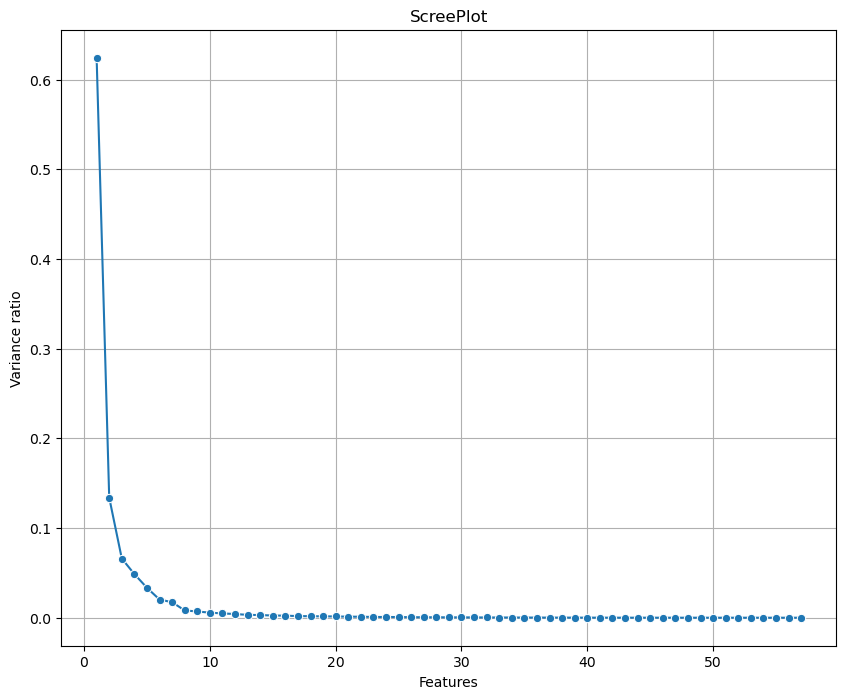

In [45]:
#show scree plot for above pca_variance_ratio
plt.figure(figsize = (10,8))
sns.lineplot(y = pca_variance_ratio, x = np.arange(1,58), marker = 'o');
plt.xlabel('Features')
plt.ylabel('Variance ratio')
plt.grid() #for grids in chart
plt.title('ScreePlot')

#we will choose first 10 eigen values which will cover 96.4% of the data for us

In [46]:
#applying PCA to extract only 10 columns
pca_model = PCA(n_components = 10, random_state = 123)
pca_final = pca_model.fit_transform(census_int_ts)

In [47]:
with np.printoptions(threshold = np.inf):
    print(pca_model.components_)

[[ 0.14922158  0.15916917  0.15820921  0.15634043  0.1568144   0.14335015
   0.14353705  0.01884873  0.01787797  0.15515239  0.14544984  0.1545511
   0.15828347  0.15407627  0.14252995  0.14193201  0.12573163  0.11169244
   0.08303496  0.11929067  0.09008881  0.14184969  0.13388011  0.1227618
   0.1168656   0.15665637  0.14869489  0.08816344  0.06516026  0.1272781
   0.11588826  0.14536607  0.14230182  0.15087675  0.14801846  0.15790761
   0.15583101  0.15764021  0.1495015   0.0947852   0.06715842  0.12818439
   0.11395923  0.14510769  0.14102942  0.15092232  0.14753416  0.14298675
   0.13378373  0.06296394  0.05674058  0.11910165  0.11304417  0.14213963
   0.14136961  0.14762899  0.14210263]
 [-0.11548673 -0.08023879 -0.09371751 -0.02034061 -0.01431023 -0.07966701
  -0.08709832  0.06910144  0.06731586 -0.10598636 -0.13323356 -0.00945956
  -0.02179345 -0.12091195 -0.07600253 -0.16669997 -0.14224991  0.04255228
   0.09589258 -0.05334228 -0.07246688 -0.10183528 -0.11325661 -0.2036023
  -

In [48]:
pca_final_comp_df = pd.DataFrame(pca_model.components_, index = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'], columns = census_int_ts.columns)
pca_final_comp_df

In [49]:
pca_final_comp_df_T = pca_final_comp_df.T

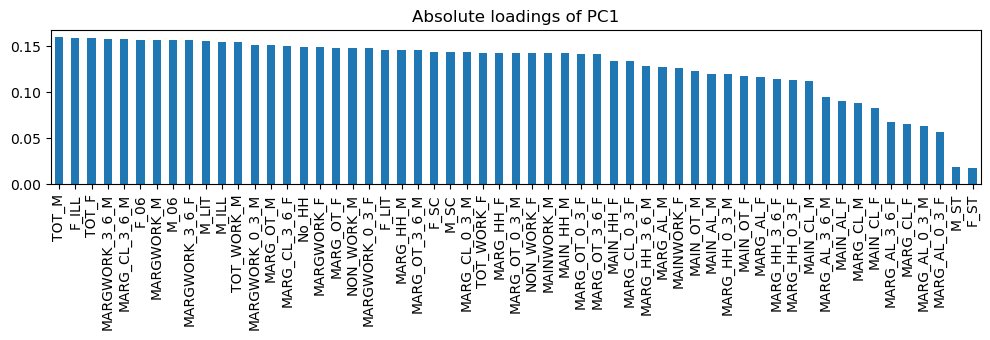

In [50]:
plt.figure(figsize = (12,2))
abs(pca_final_comp_df_T['PC1']).T.sort_values(ascending = False).plot.bar();
plt.title('Absolute loadings of PC1');

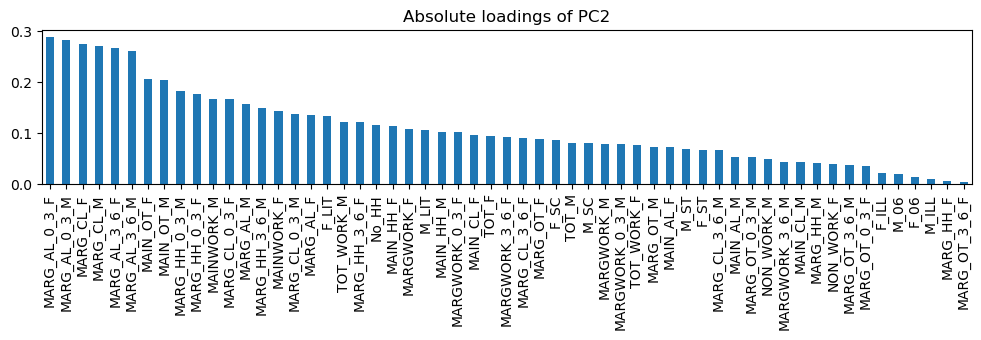

In [51]:
plt.figure(figsize = (12,2))
abs(pca_final_comp_df_T['PC2']).T.sort_values(ascending = False).plot.bar();
plt.title('Absolute loadings of PC2');

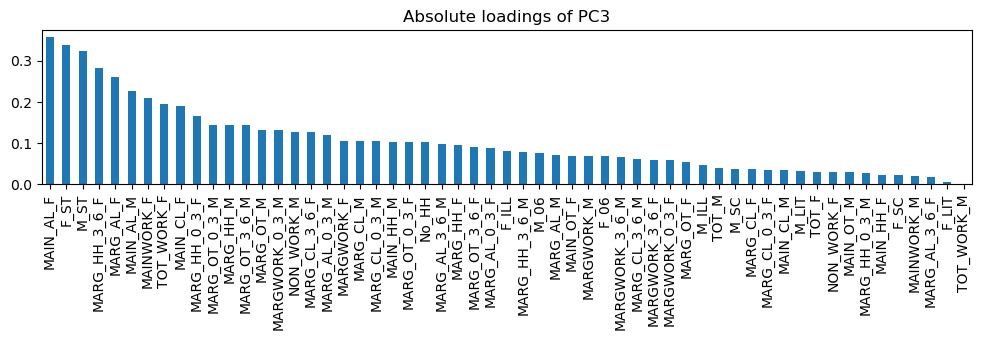

In [52]:
plt.figure(figsize = (12,2))
abs(pca_final_comp_df_T['PC3']).T.sort_values(ascending = False).plot.bar();
plt.title('Absolute loadings of PC3');

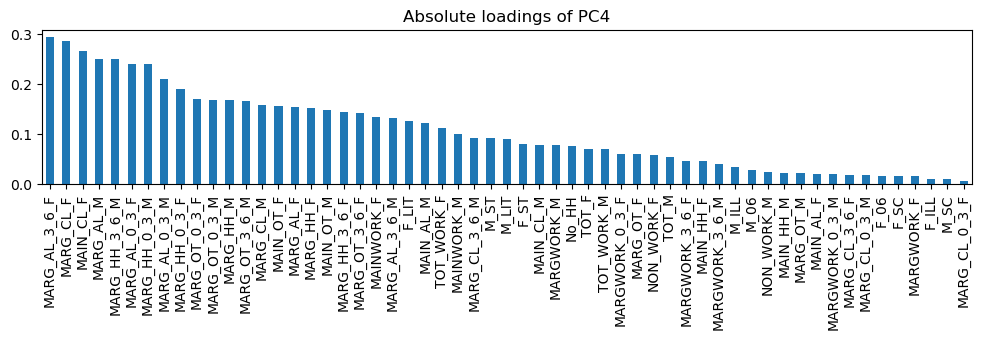

In [53]:
plt.figure(figsize = (12,2))
abs(pca_final_comp_df_T['PC4']).T.sort_values(ascending = False).plot.bar();
plt.title('Absolute loadings of PC4');

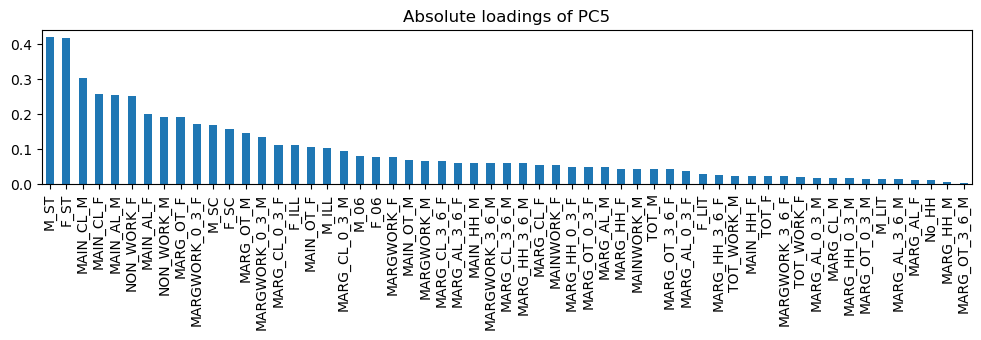

In [54]:
plt.figure(figsize = (12,2))
abs(pca_final_comp_df_T['PC5']).T.sort_values(ascending = False).plot.bar();
plt.title('Absolute loadings of PC5');

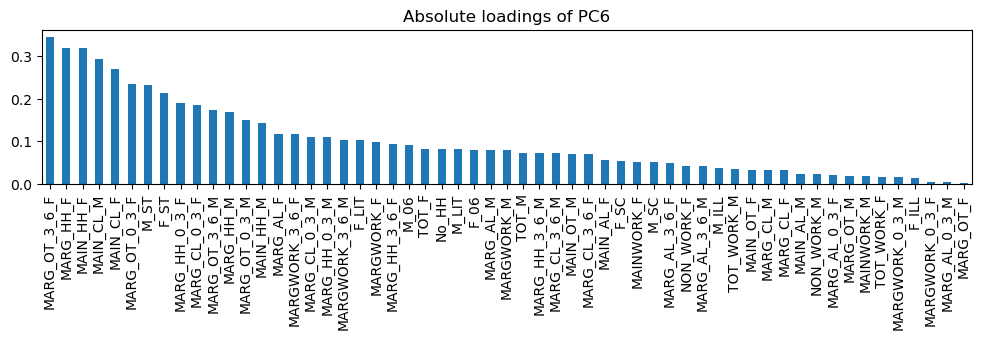

In [55]:
plt.figure(figsize = (12,2))
abs(pca_final_comp_df_T['PC6']).T.sort_values(ascending = False).plot.bar();
plt.title('Absolute loadings of PC6');

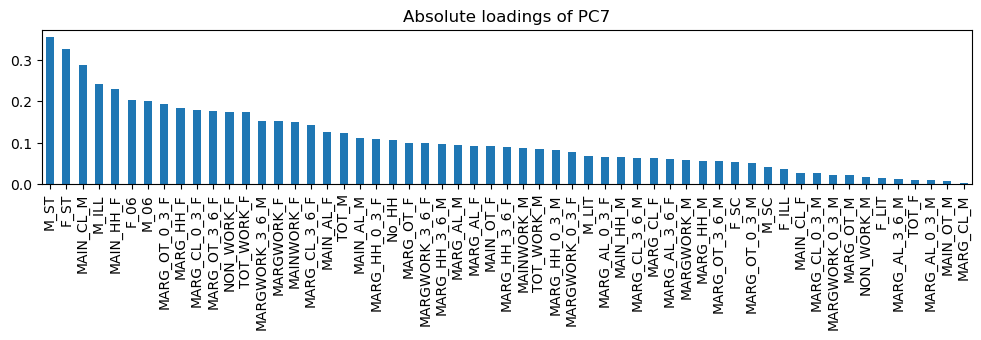

In [56]:
plt.figure(figsize = (12,2))
abs(pca_final_comp_df_T['PC7']).T.sort_values(ascending = False).plot.bar();
plt.title('Absolute loadings of PC7');

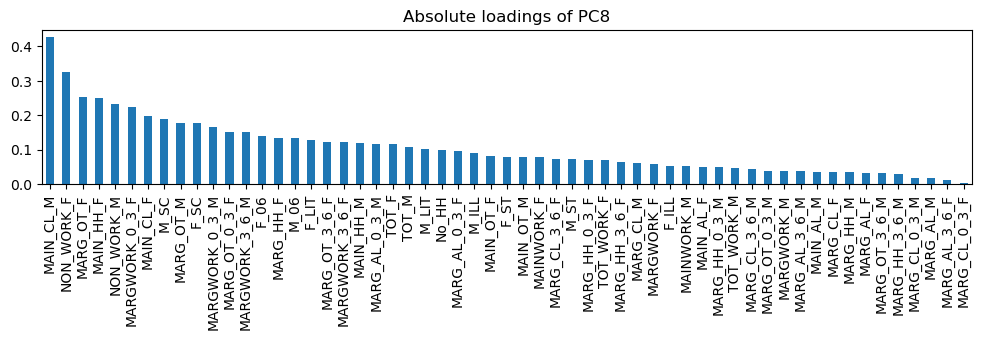

In [57]:
plt.figure(figsize = (12,2))
abs(pca_final_comp_df_T['PC8']).T.sort_values(ascending = False).plot.bar();
plt.title('Absolute loadings of PC8');

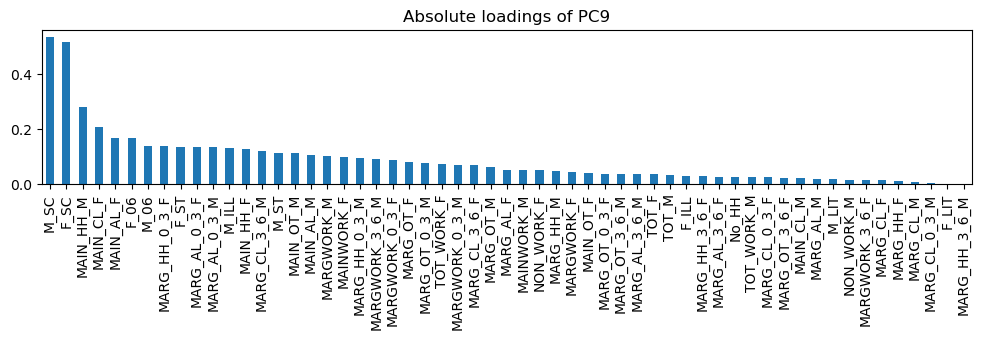

In [58]:
plt.figure(figsize = (12,2))
abs(pca_final_comp_df_T['PC9']).T.sort_values(ascending = False).plot.bar();
plt.title('Absolute loadings of PC9');

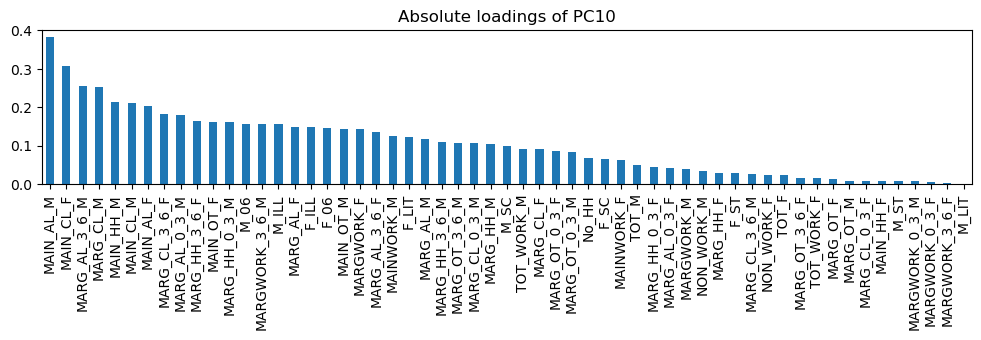

In [59]:
plt.figure(figsize = (12,2))
abs(pca_final_comp_df_T['PC10']).T.sort_values(ascending = False).plot.bar();
plt.title('Absolute loadings of PC10');

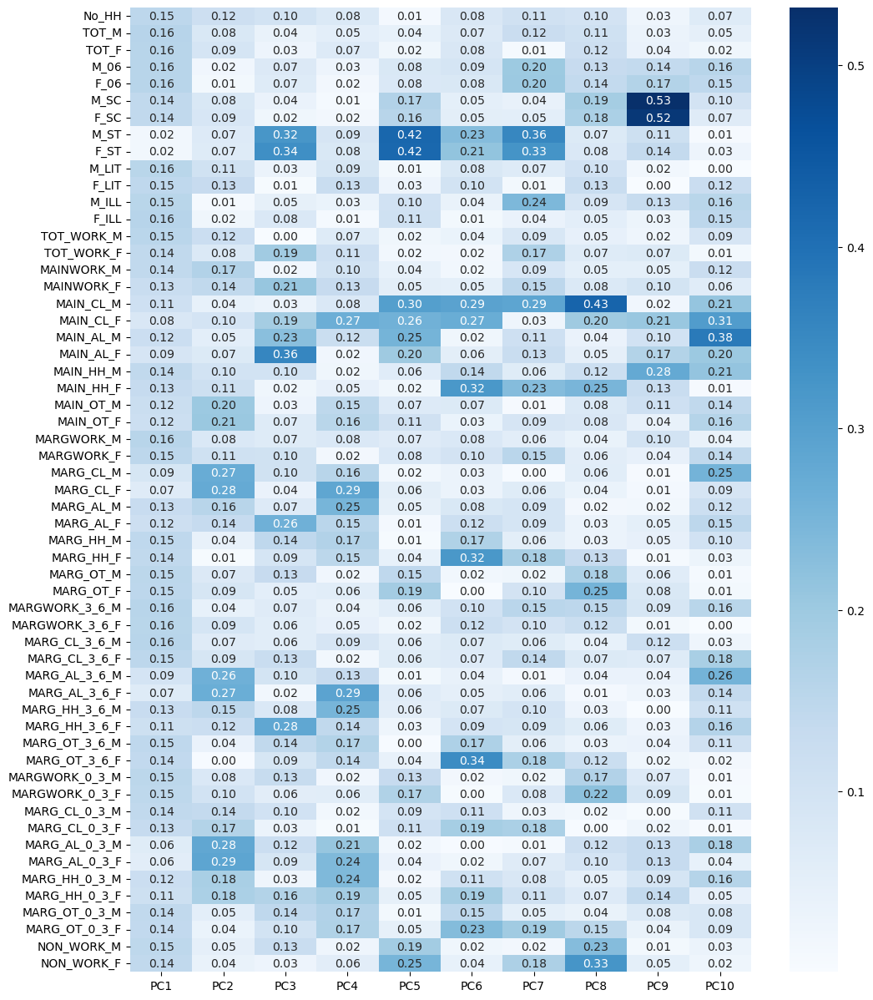

In [60]:
#Compare how the original features influence various PCs
plt.figure(figsize = (12,15))
sns.heatmap(abs(pca_final_comp_df_T), annot = True, cmap = 'Blues',fmt = '.2f');

In [61]:
pca_final_df = pd.DataFrame(pca_final, columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'])

In [62]:
pca_final_df.shape

(640, 10)

In [63]:
pca_final_df.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,-5.528161,0.430378,-1.473827,-1.278049,0.376358,0.536634,-0.379796,-0.261872,0.349283,0.338051
1,-5.492016,-0.106110,-2.015641,-1.750168,-0.006857,-1.006038,0.288553,-0.513547,0.317033,-0.389631
2,-7.474643,-0.217194,-0.247428,0.006079,0.556282,-0.150034,-0.190095,-0.118042,0.038825,-0.245781
3,-7.919737,-0.652311,-0.659220,-0.735550,0.272465,0.212952,0.110382,-0.038089,-0.014032,-0.117605
4,-5.175695,2.304059,-1.157327,1.060796,1.080249,-0.050521,0.073161,-0.677402,-0.236753,0.662862


In [64]:
pca_final_df.tail()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
635,-7.946040,-1.302846,-0.819360,-0.871301,-0.101966,0.533559,0.236931,-0.036711,0.176688,-0.169134
636,-7.244719,-1.396520,-0.719443,-0.895934,-0.062742,0.552805,0.435032,0.010509,0.038017,-0.054548
637,-7.886268,-1.003537,-0.909285,-1.238009,0.146031,-0.046046,0.361532,0.040313,0.149283,-0.230975
638,-7.864260,-0.999338,-0.851569,-0.782561,-0.081681,0.441821,0.309963,0.127153,0.169276,-0.058645
639,-7.416226,-1.412143,-0.865921,-0.680528,0.096861,0.549783,0.277154,0.071644,0.270571,-0.030467


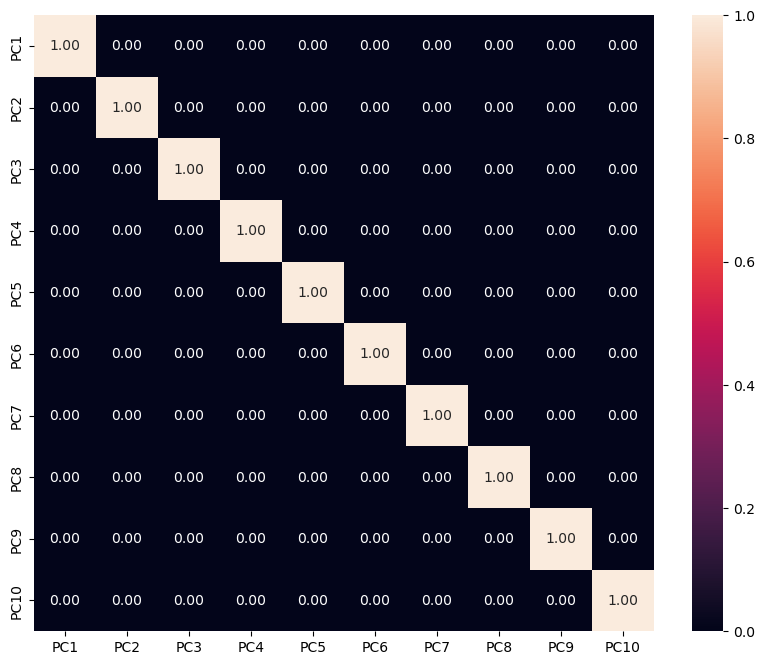

In [65]:
#Check for presence of correlations among the PCs
plt.figure(figsize = (10,8))
sns.heatmap(abs(pca_final_df.corr()), annot=True,fmt='.2f');

In [66]:
#write linear equations for pcs
for i in range(0,57):
    print("(",np.round(pca_model.components_[0][i],2),")",'*',census_int_ts.columns[i], end=' + ')

( 0.15 ) * No_HH + ( 0.16 ) * TOT_M + ( 0.16 ) * TOT_F + ( 0.16 ) * M_06 + ( 0.16 ) * F_06 + ( 0.14 ) * M_SC + ( 0.14 ) * F_SC + ( 0.02 ) * M_ST + ( 0.02 ) * F_ST + ( 0.16 ) * M_LIT + ( 0.15 ) * F_LIT + ( 0.15 ) * M_ILL + ( 0.16 ) * F_ILL + ( 0.15 ) * TOT_WORK_M + ( 0.14 ) * TOT_WORK_F + ( 0.14 ) * MAINWORK_M + ( 0.13 ) * MAINWORK_F + ( 0.11 ) * MAIN_CL_M + ( 0.08 ) * MAIN_CL_F + ( 0.12 ) * MAIN_AL_M + ( 0.09 ) * MAIN_AL_F + ( 0.14 ) * MAIN_HH_M + ( 0.13 ) * MAIN_HH_F + ( 0.12 ) * MAIN_OT_M + ( 0.12 ) * MAIN_OT_F + ( 0.16 ) * MARGWORK_M + ( 0.15 ) * MARGWORK_F + ( 0.09 ) * MARG_CL_M + ( 0.07 ) * MARG_CL_F + ( 0.13 ) * MARG_AL_M + ( 0.12 ) * MARG_AL_F + ( 0.15 ) * MARG_HH_M + ( 0.14 ) * MARG_HH_F + ( 0.15 ) * MARG_OT_M + ( 0.15 ) * MARG_OT_F + ( 0.16 ) * MARGWORK_3_6_M + ( 0.16 ) * MARGWORK_3_6_F + ( 0.16 ) * MARG_CL_3_6_M + ( 0.15 ) * MARG_CL_3_6_F + ( 0.09 ) * MARG_AL_3_6_M + ( 0.07 ) * MARG_AL_3_6_F + ( 0.13 ) * MARG_HH_3_6_M + ( 0.11 ) * MARG_HH_3_6_F + ( 0.15 ) * MARG_OT_3_6_M + ( 